<h1><center> Amazon Apparel Recommendations<center> </h1>

### [4.2] Data:
https://drive.google.com/open?id=0BwNkduBnePt2VWhCYXhMV3p4dTg

In [3]:
import pandas as pd
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

## Before going to Project:
1.Data is collected from AMAZON API image too <br>
2.In next stage i Preprocessed the data of title to all lowercase,remove dollar symbol price <br>
3.Removed duplicate values and preprocessing steps like Stemming etc.,<br>

In [4]:
data = pd.read_pickle('16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


## IDF-W2V vec


In [5]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [6]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [36]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    #ax.set_xticklabels(sentence2.split(),rotation=0,ha='right',fontsize=14)
    # set the y axis labels as input apparels title
    #ax.set_yticklabels(sentence1.split(),rotation=0,ha='right',fontsize=14)
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [7]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

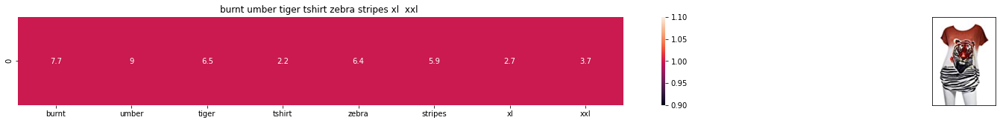

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from the given image : 0.0


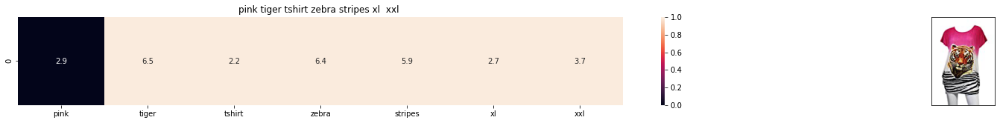

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from the given image : 12.20507131122177


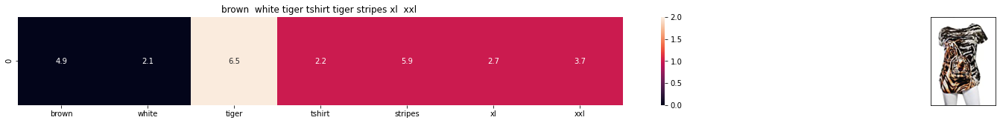

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from the given image : 14.468362685603465


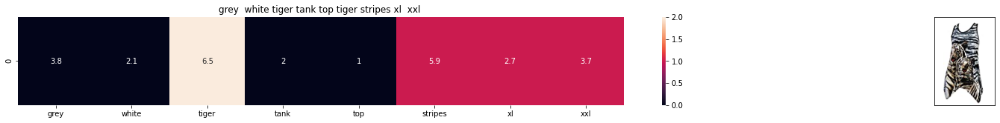

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from the given image : 14.486832924778964


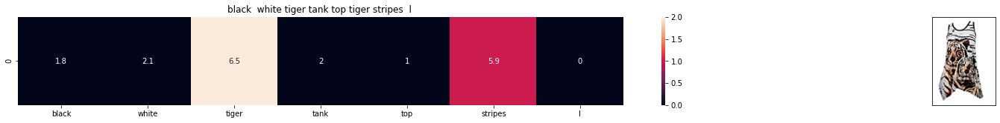

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from the given image : 14.833392966672909


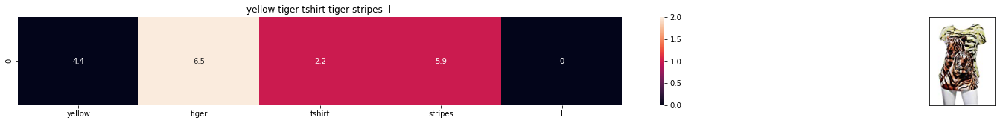

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from the given image : 14.898744516719225


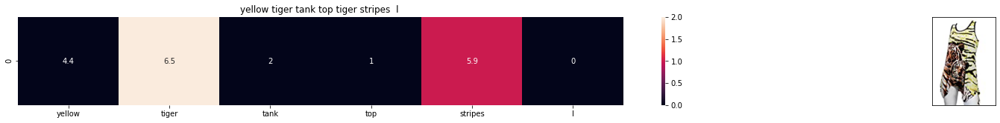

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from the given image : 15.224458287343769


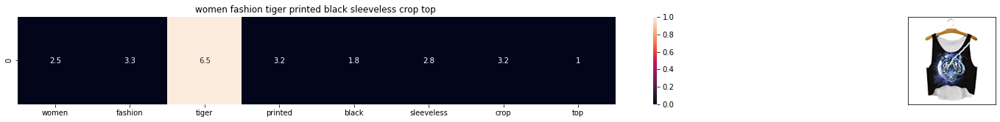

ASIN : B074T8ZYGX
Brand : MKP Crop Top
euclidean distance from the given image : 17.080812955631995


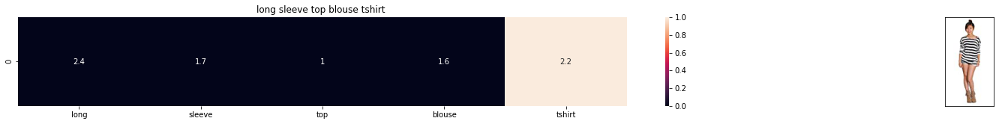

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 17.090168125645416


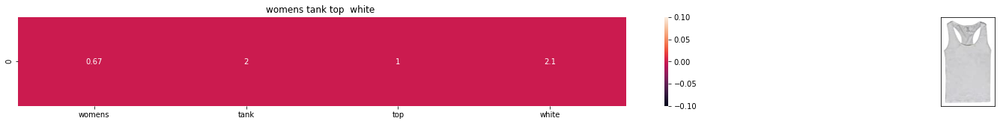

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 17.153215337562703


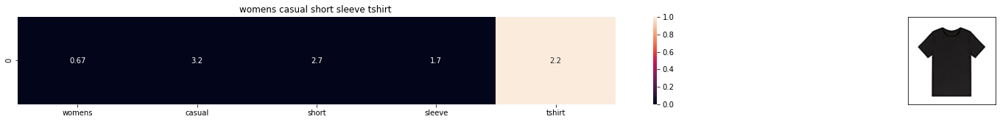

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 17.33671523874989


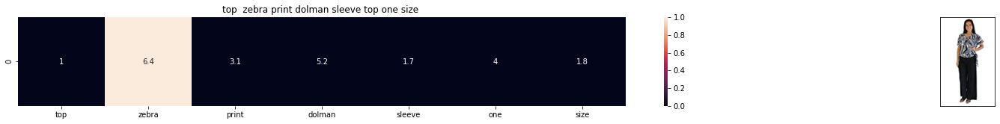

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from the given image : 17.410075941001253


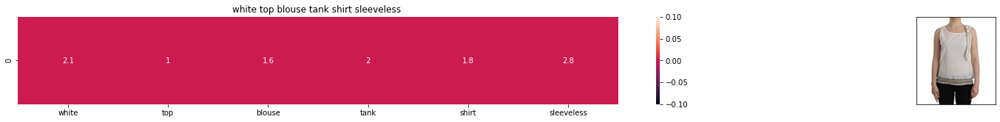

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 17.539921335459557


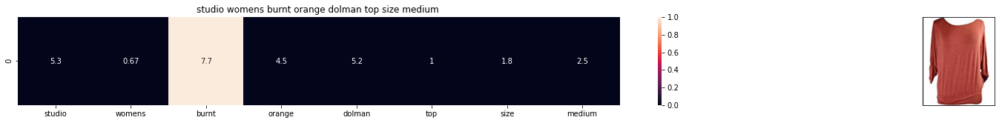

ASIN : B06XSCVFT5
Brand : Studio M
euclidean distance from the given image : 17.61275854366134


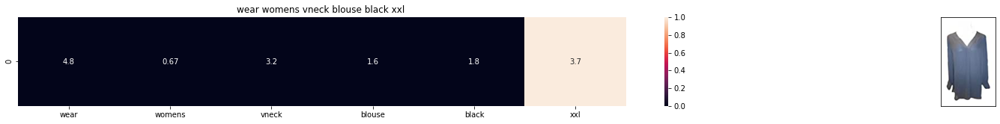

ASIN : B06Y6FH453
Brand : Who What Wear
euclidean distance from the given image : 17.623745282500135


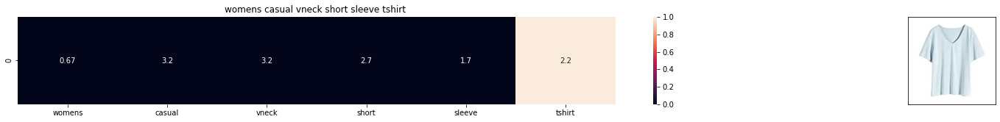

ASIN : B074V45DCX
Brand : Rain
euclidean distance from the given image : 17.634342496835046


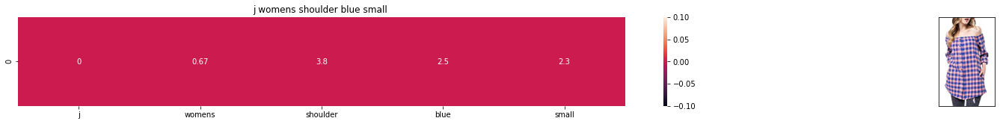

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 17.63753712743611


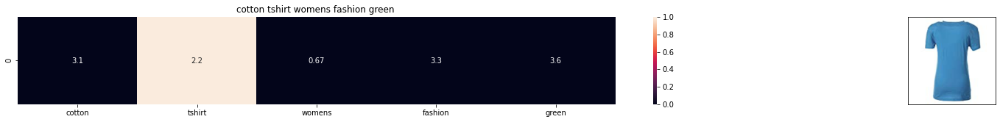

ASIN : B073GJGVBN
Brand : Ivan Levi
euclidean distance from the given image : 17.7230738913371


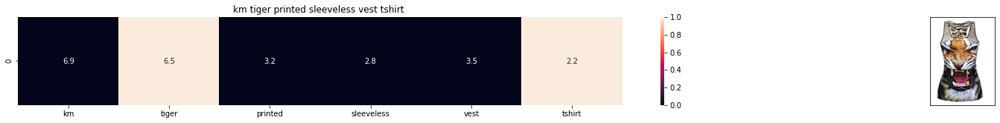

ASIN : B012VQLT6Y
Brand : KM T-shirt
euclidean distance from the given image : 17.762588561202364


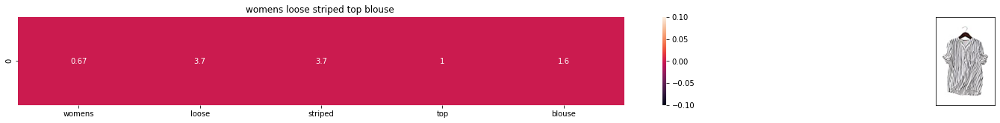

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
euclidean distance from the given image : 17.779536864674238


In [25]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(12566,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

## W2Vec Models:


In [14]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.
# Do NOT RUN this code.
# It is meant as a reference to build your own Word2Vec when you have 
# lots of data.

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

'\n# Set values for various parameters\nnum_features = 300    # Word vector dimensionality                      \nmin_word_count = 1    # Minimum word count                        \nnum_workers = 4       # Number of threads to run in parallel\ncontext = 10          # Context window size                                                                                    \ndownsampling = 1e-3   # Downsample setting for frequent words\n\n# Initialize and train the model (this will take some time)\nfrom gensim.models import word2vec\nprint ("Training model...")\nmodel = word2vec.Word2Vec(sen_corpus, workers=num_workers,             size=num_features, min_count = min_word_count,             window = context)\n    \n'

In [26]:

import pickle

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.

'''
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
'''

#if you do NOT have RAM >= 12GB, use the code below.
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [27]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)



### [9.2] Average Word2Vec product similarity.

In [28]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)

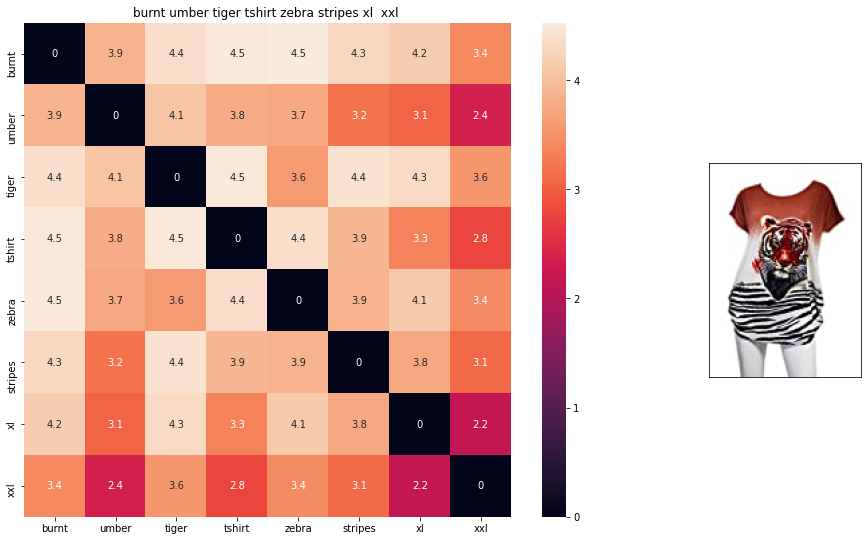

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.0


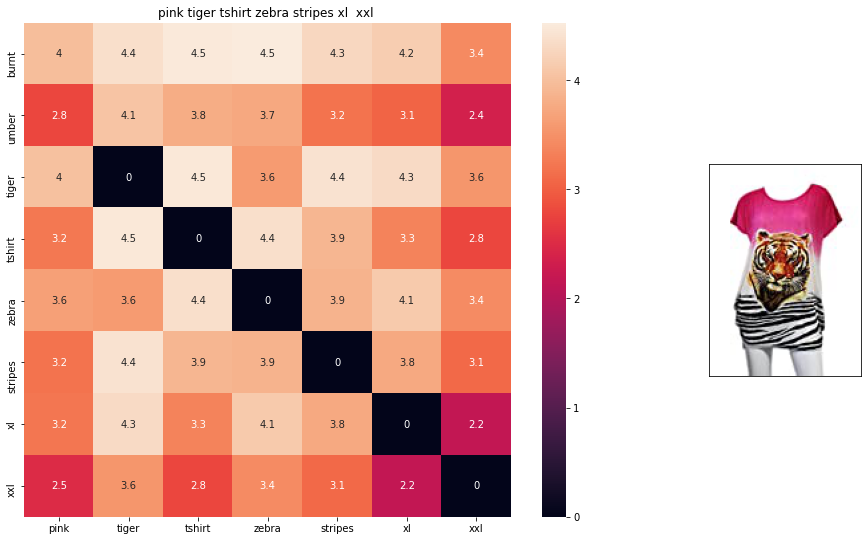

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 0.5891926


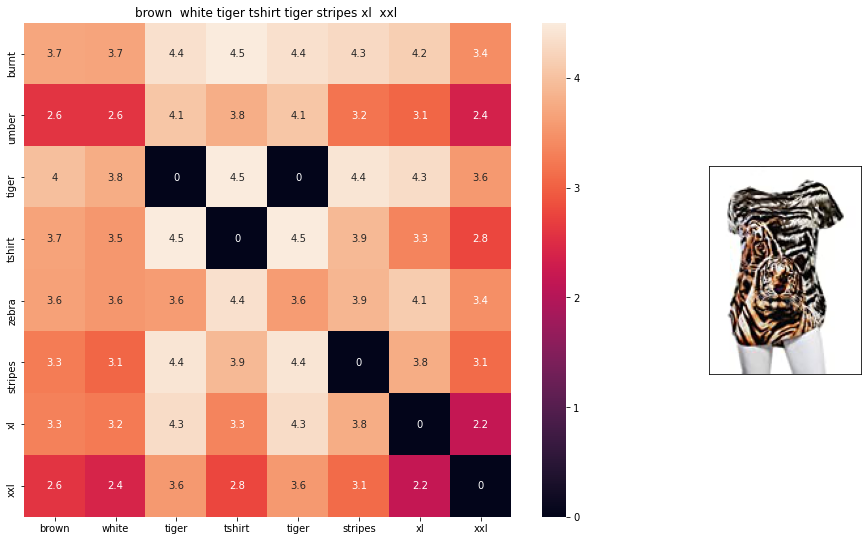

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 0.7003438


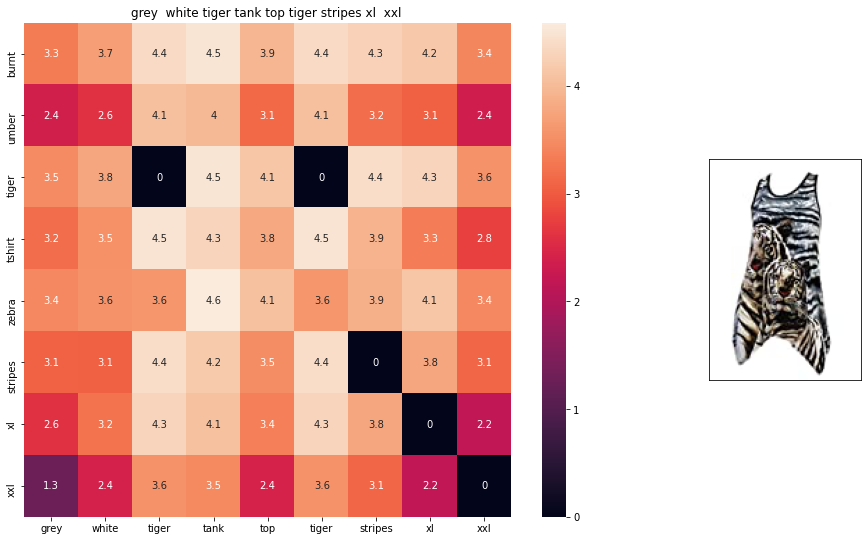

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 0.89283955


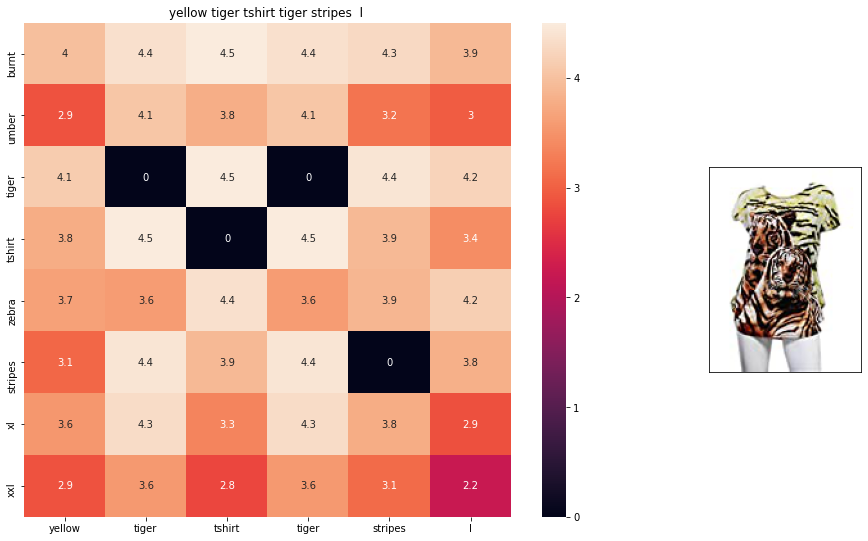

ASIN : B00JXQCUIC
BRAND : Si Row
euclidean distance from given input image : 0.95601255


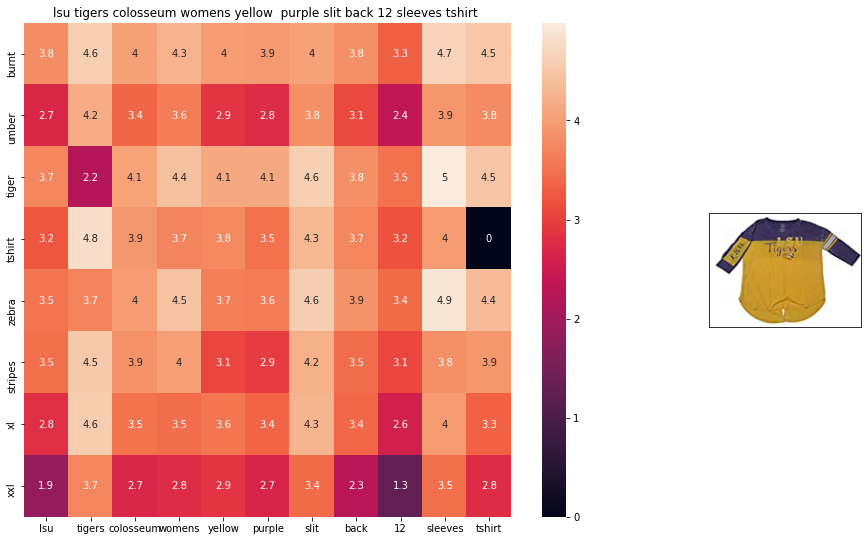

ASIN : B073R5Q8HD
BRAND : Colosseum
euclidean distance from given input image : 1.022969


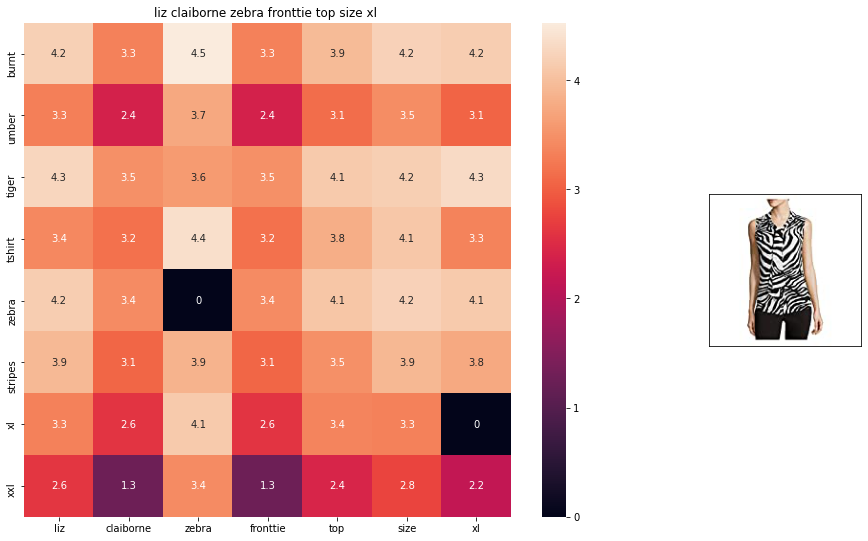

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
euclidean distance from given input image : 1.0669324


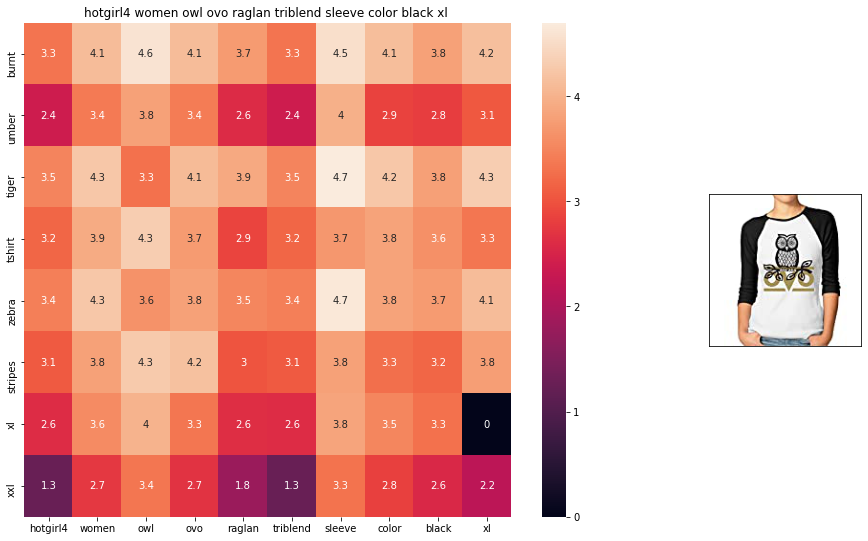

ASIN : B01L8L73M2
BRAND : Hotgirl4 Raglan Design
euclidean distance from given input image : 1.0731405


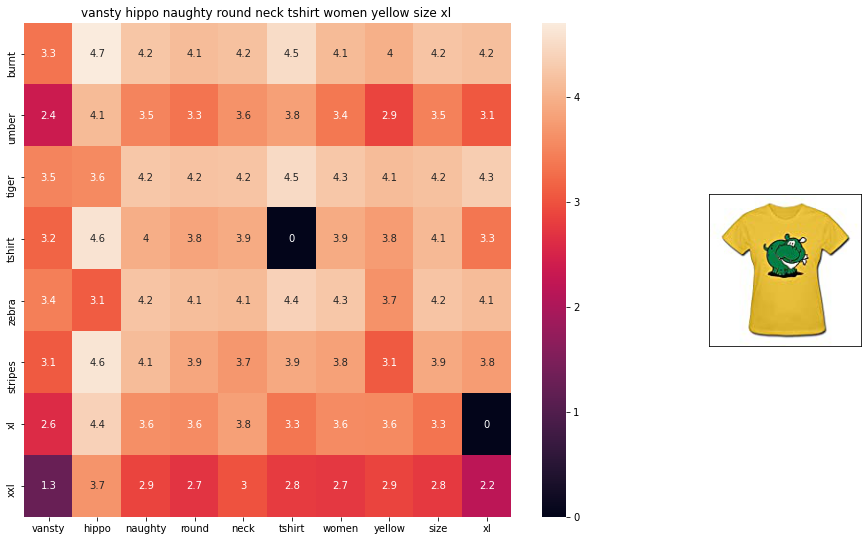

ASIN : B01EJS5H06
BRAND : Vansty
euclidean distance from given input image : 1.075719


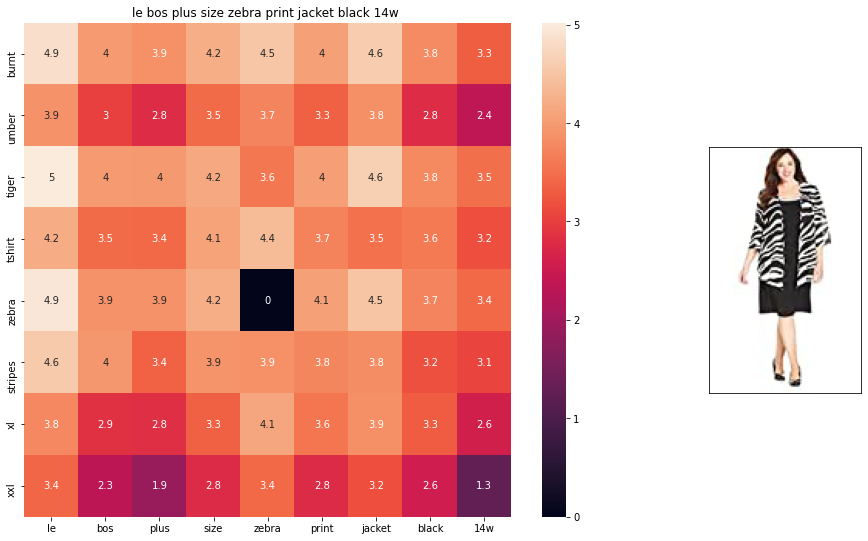

ASIN : B01BO1XRK8
BRAND : Le Bos
euclidean distance from given input image : 1.0839964


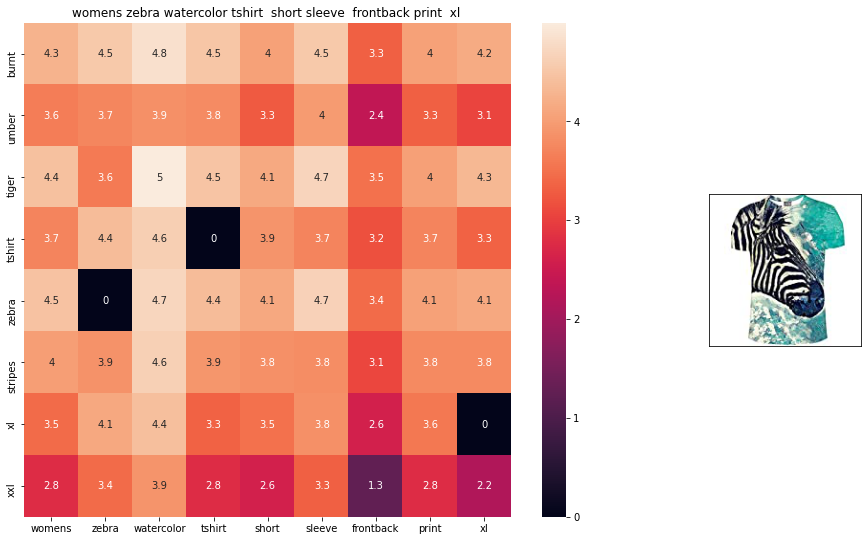

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
euclidean distance from given input image : 1.0842218


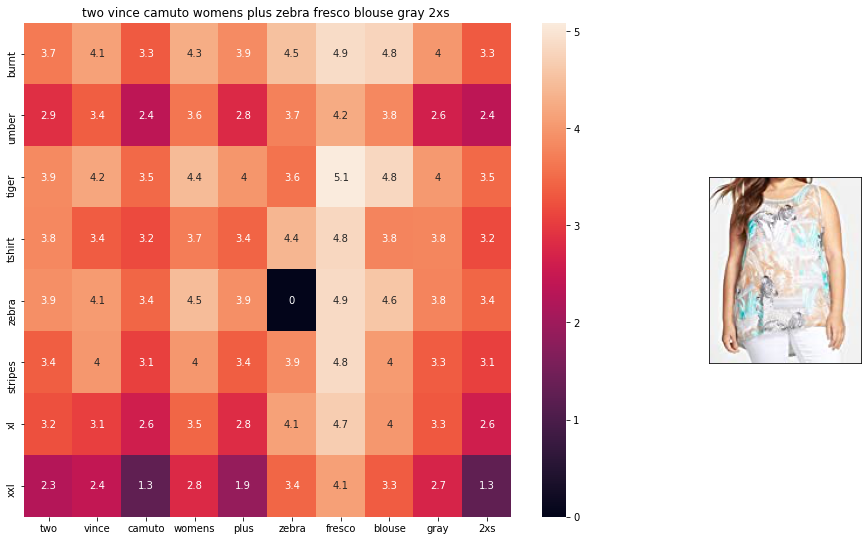

ASIN : B074MJRGW6
BRAND : Two by Vince Camuto
euclidean distance from given input image : 1.0895038


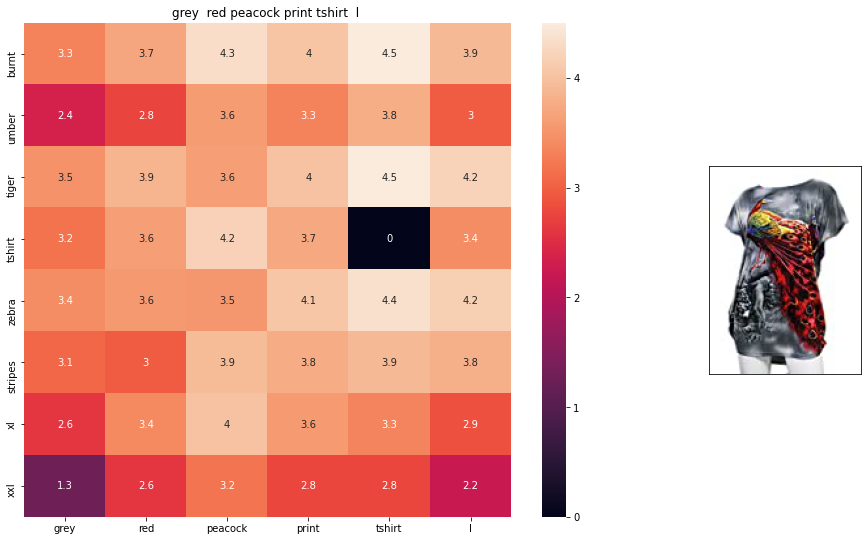

ASIN : B00JXQCFRS
BRAND : Si Row
euclidean distance from given input image : 1.0900588


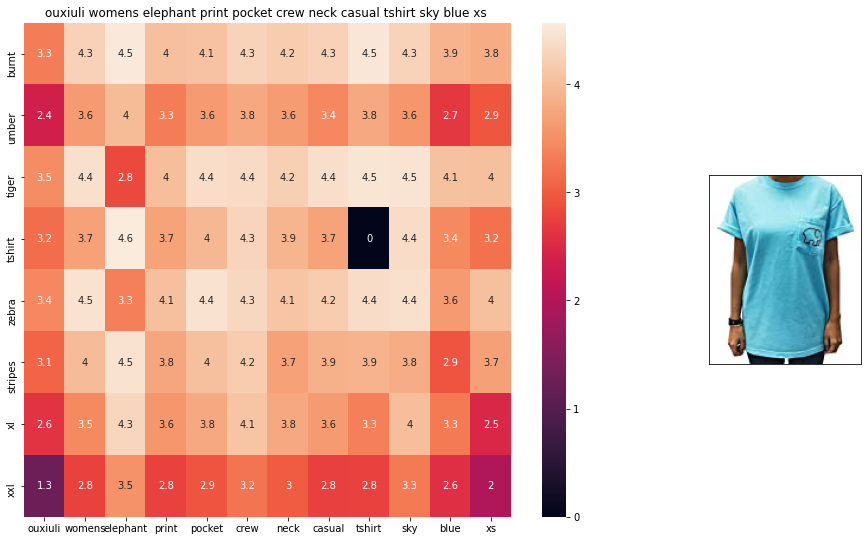

ASIN : B01I53HU6K
BRAND : ouxiuli
euclidean distance from given input image : 1.0920111


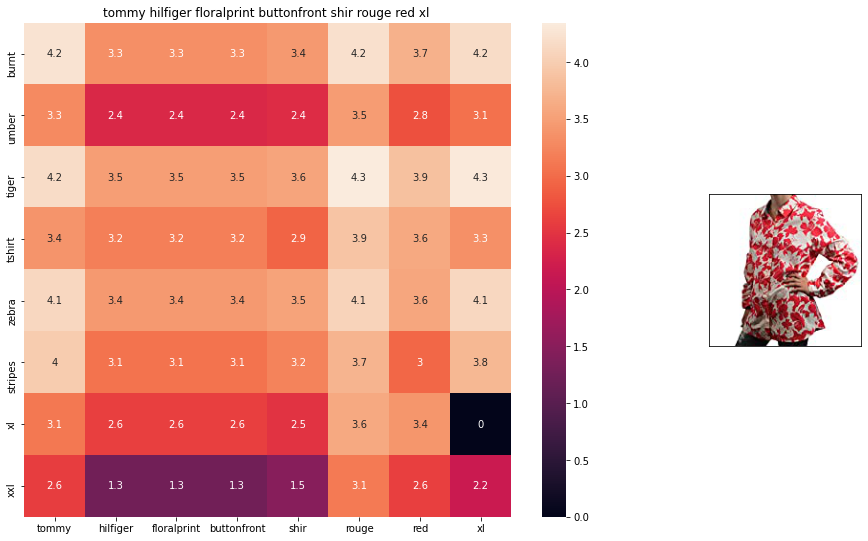

ASIN : B0711NGTQM
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0923415


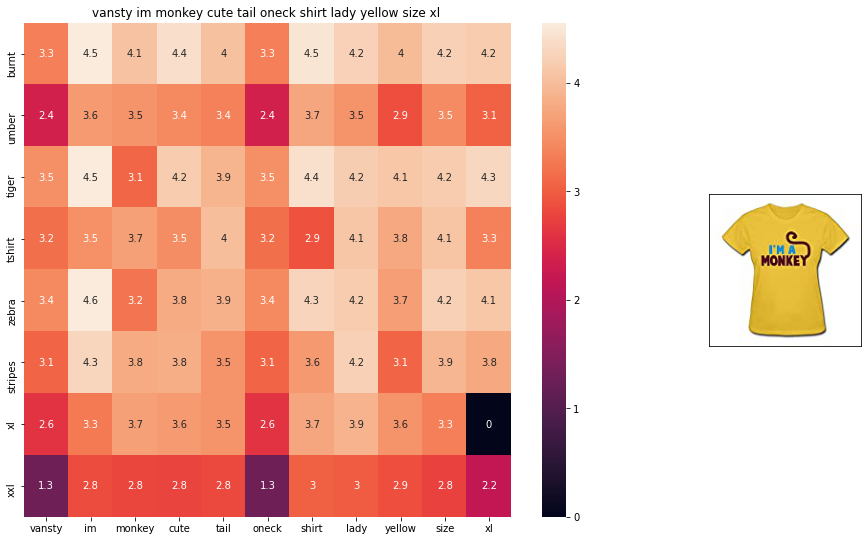

ASIN : B01EFSLO8Y
BRAND : Vansty
euclidean distance from given input image : 1.0934004


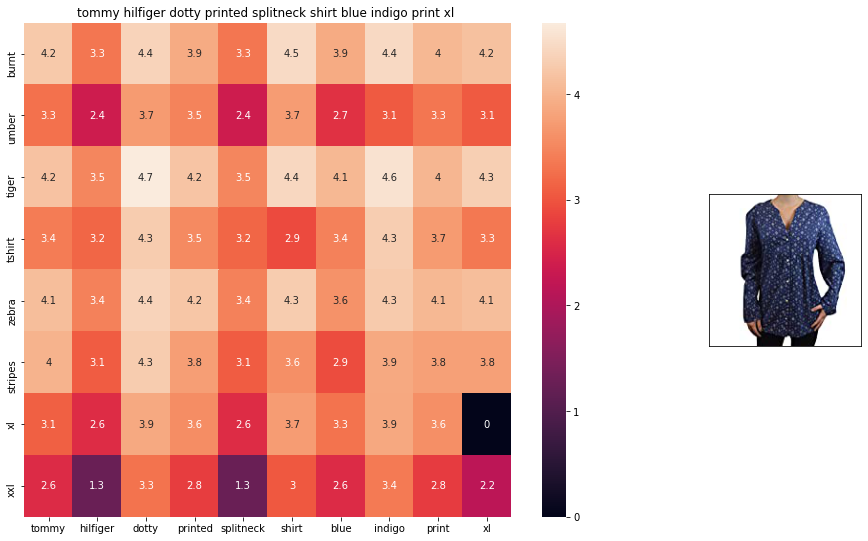

ASIN : B0716TVWQ4
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0942024


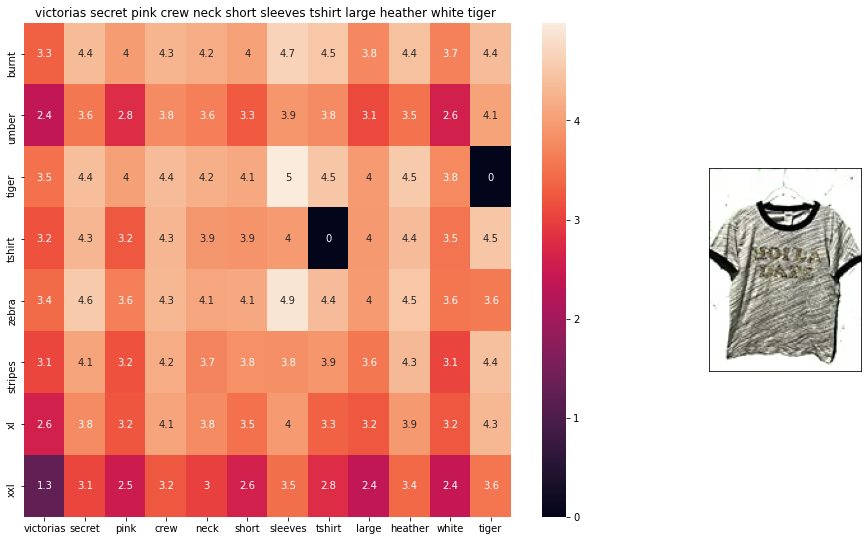

ASIN : B0716MVPGV
BRAND : V.Secret
euclidean distance from given input image : 1.0948304


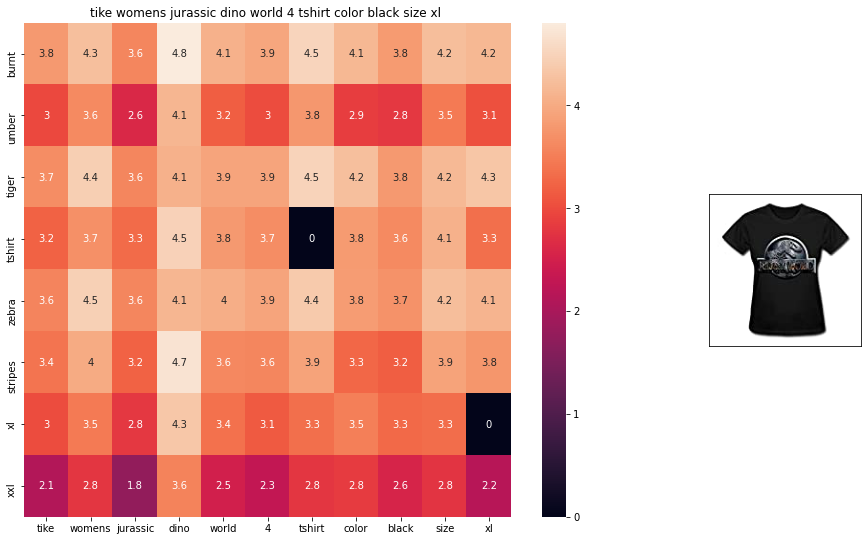

ASIN : B016OPN4OI
BRAND : TIKE Fashions
euclidean distance from given input image : 1.0951275


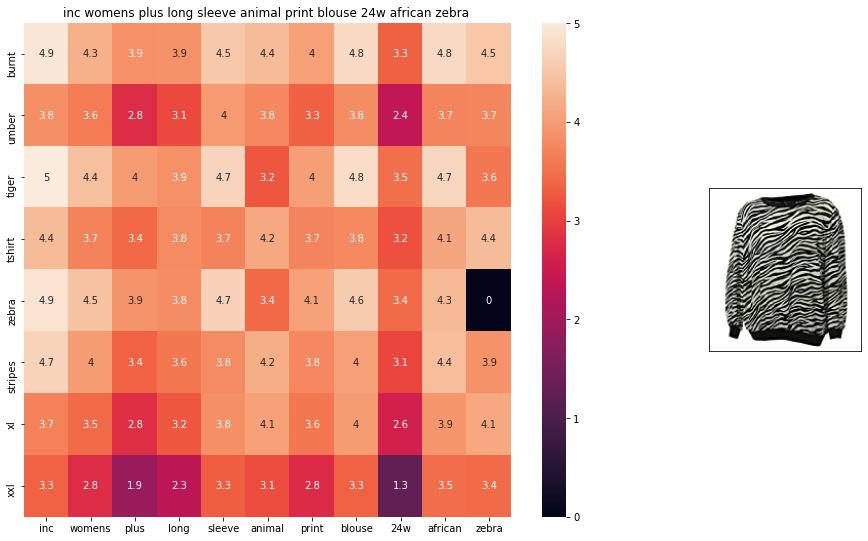

ASIN : B018WDJCUA
BRAND : INC - International Concepts Woman
euclidean distance from given input image : 1.0966892


In [29]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

### [9.4]  IDF weighted Word2Vec for product similarity

In [30]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

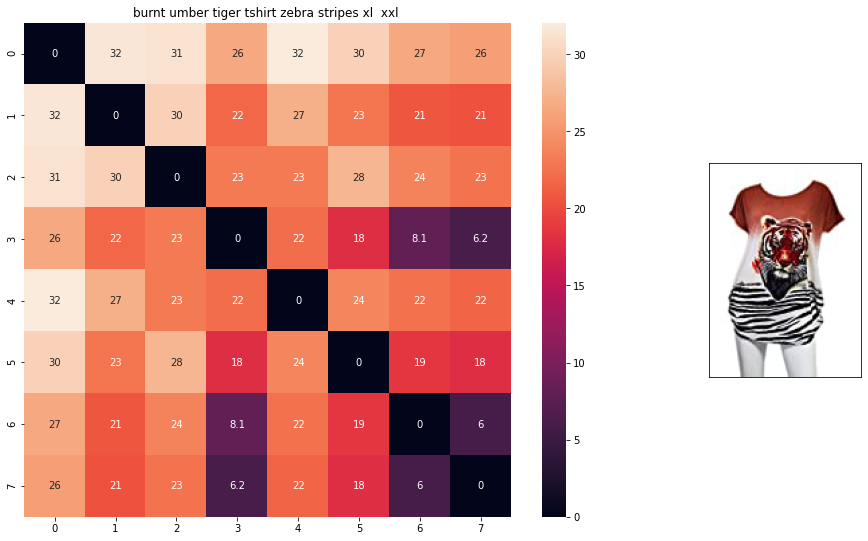

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 1.6858739e-07


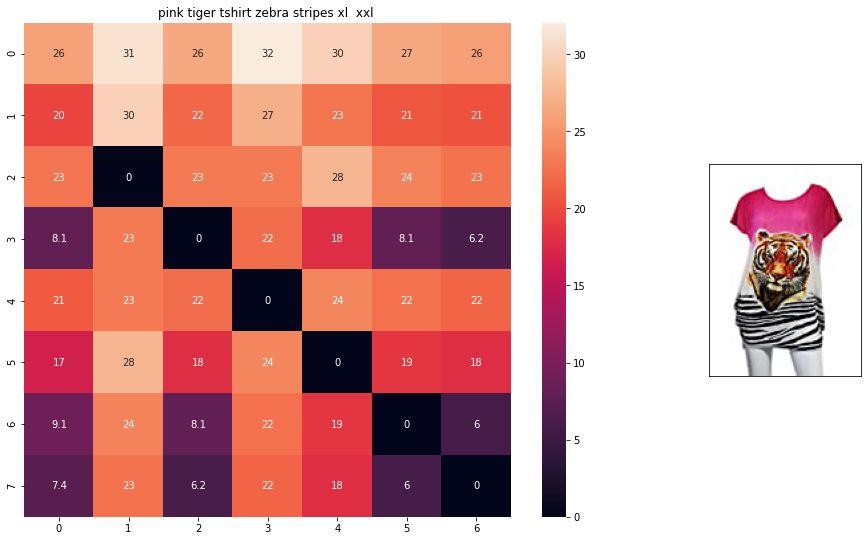

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.0638866


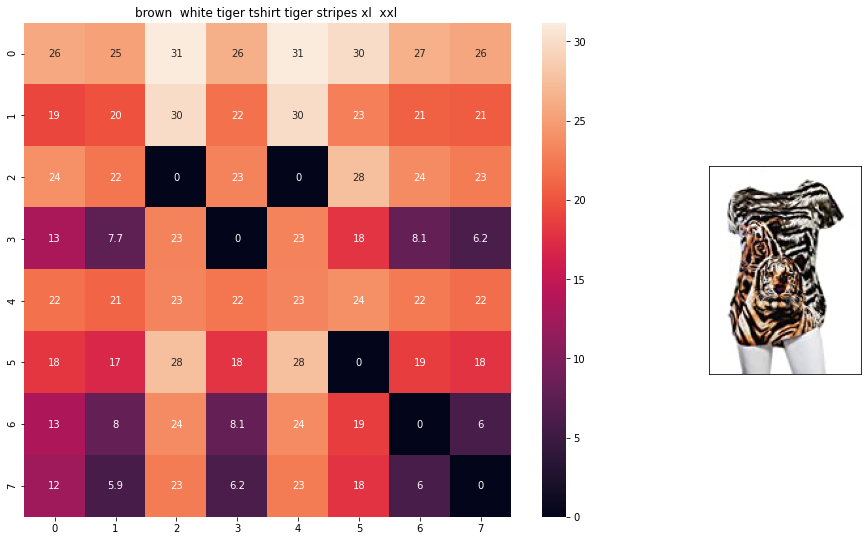

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 4.7709413


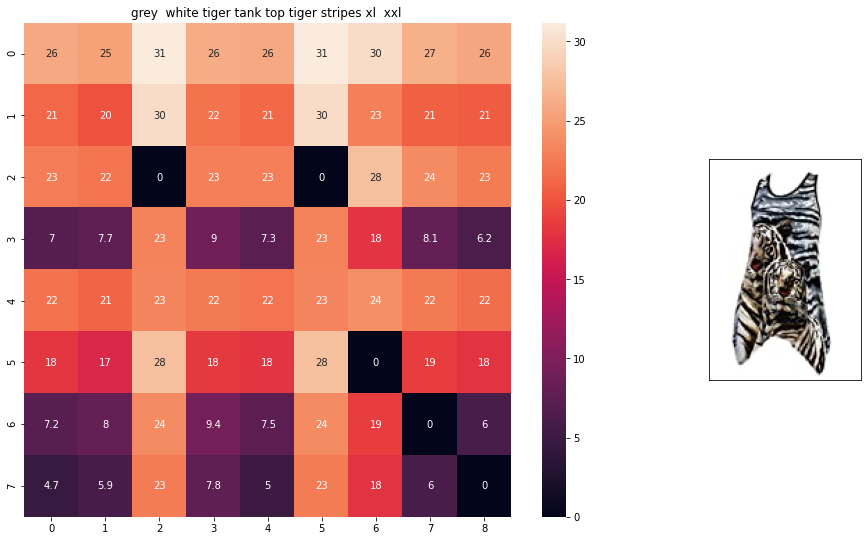

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 5.3601604


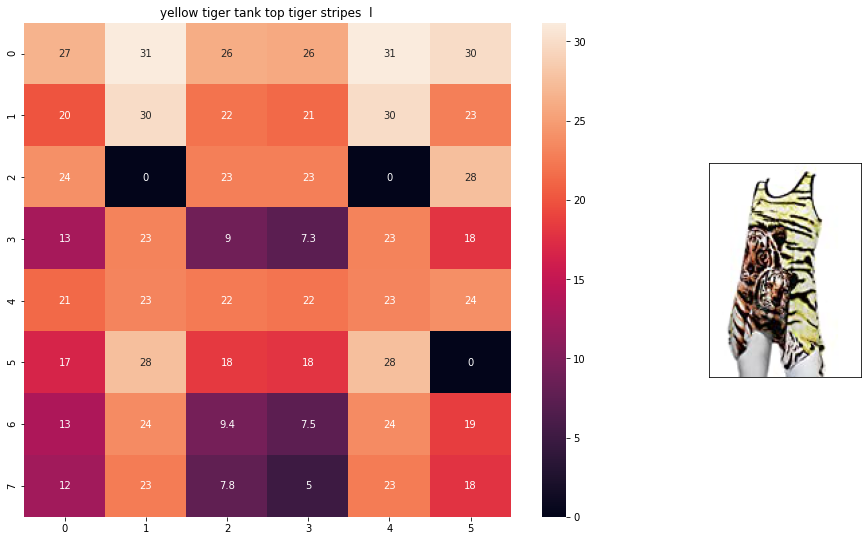

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 5.6895227


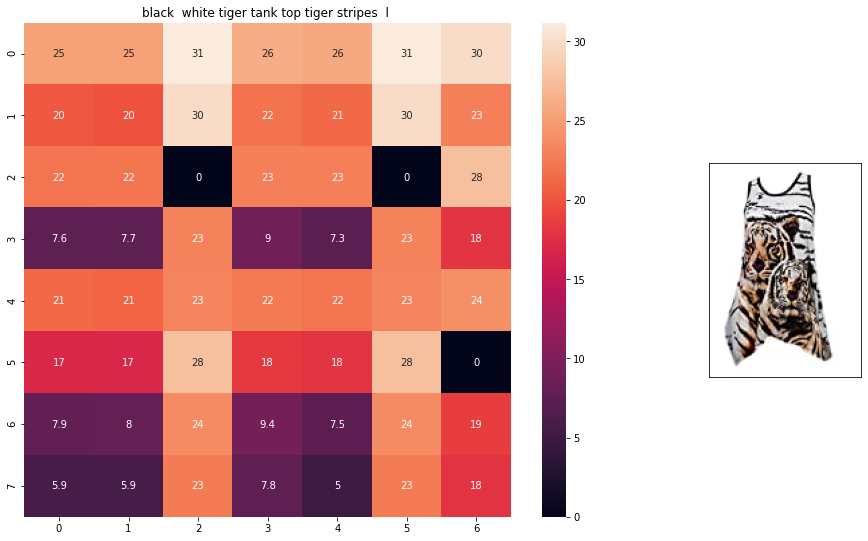

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 5.693021


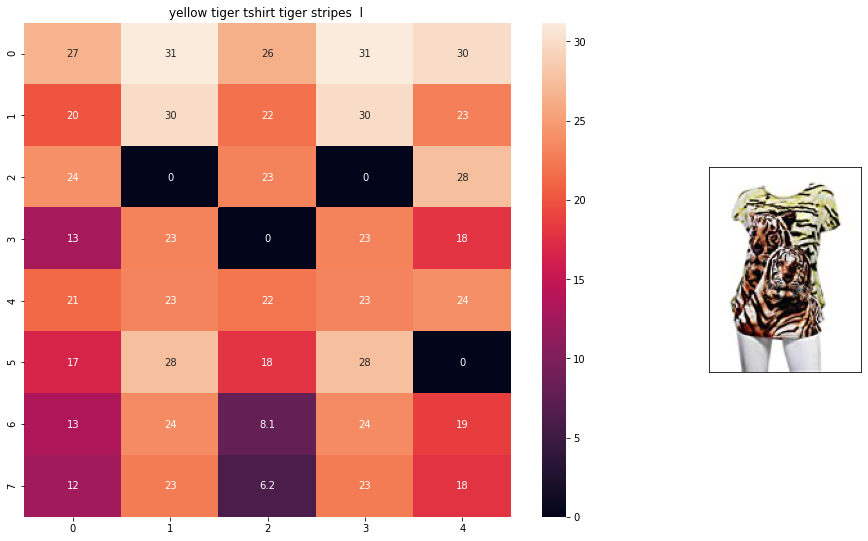

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 5.893442


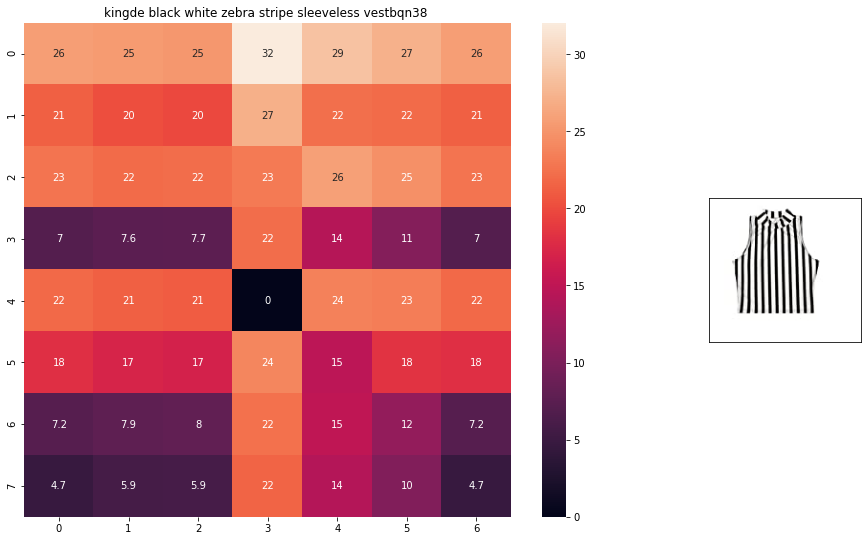

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 6.1329894


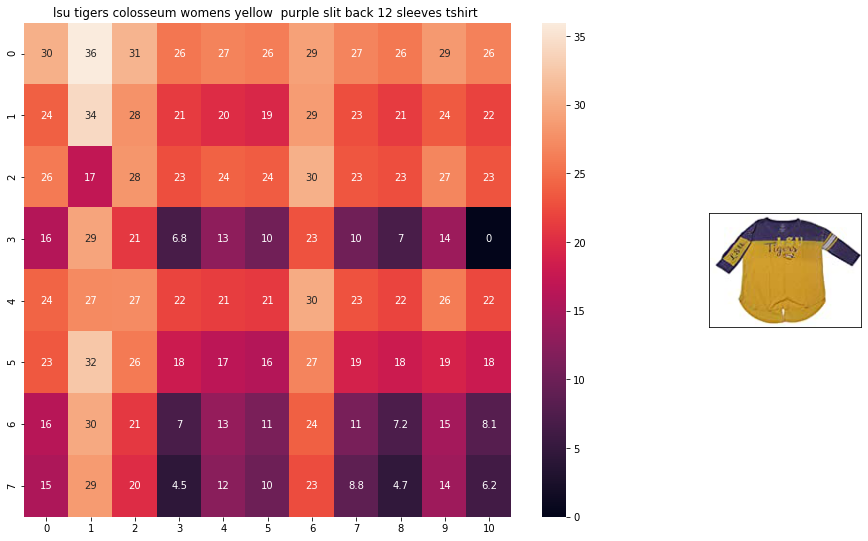

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 6.2567053


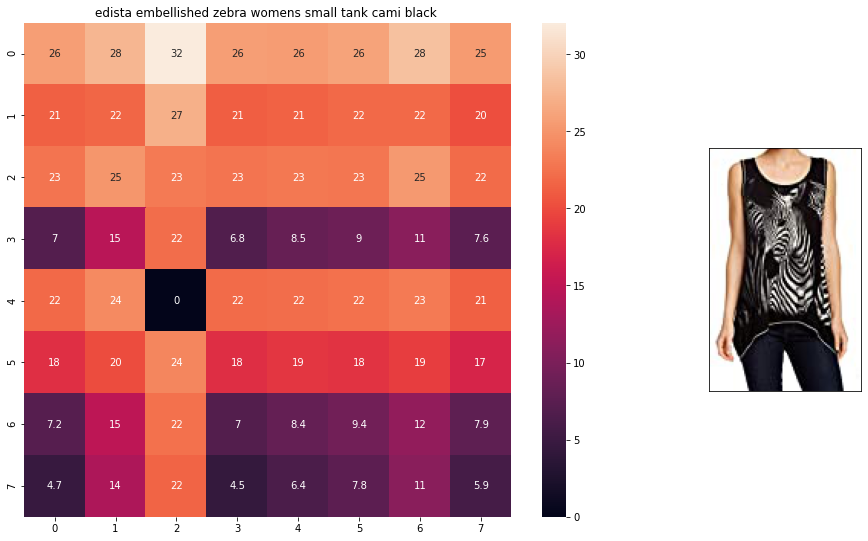

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 6.3922033


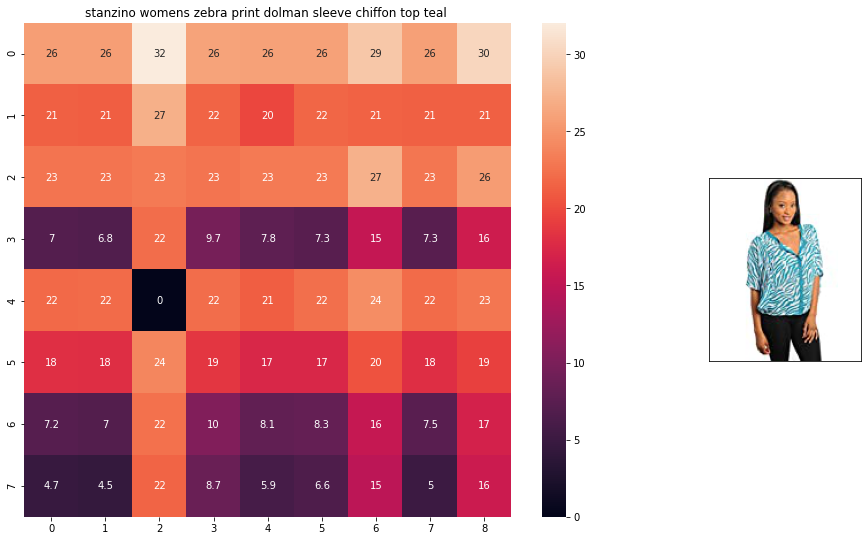

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 6.4149003


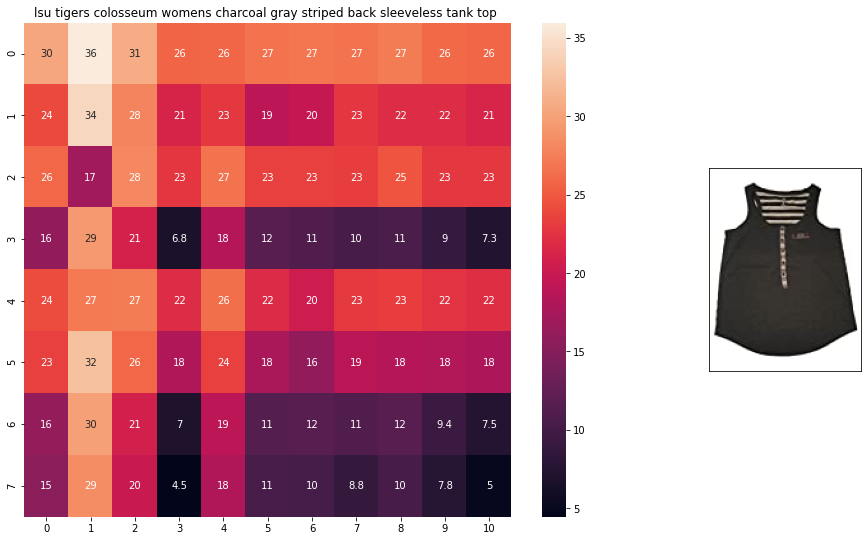

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 6.450959


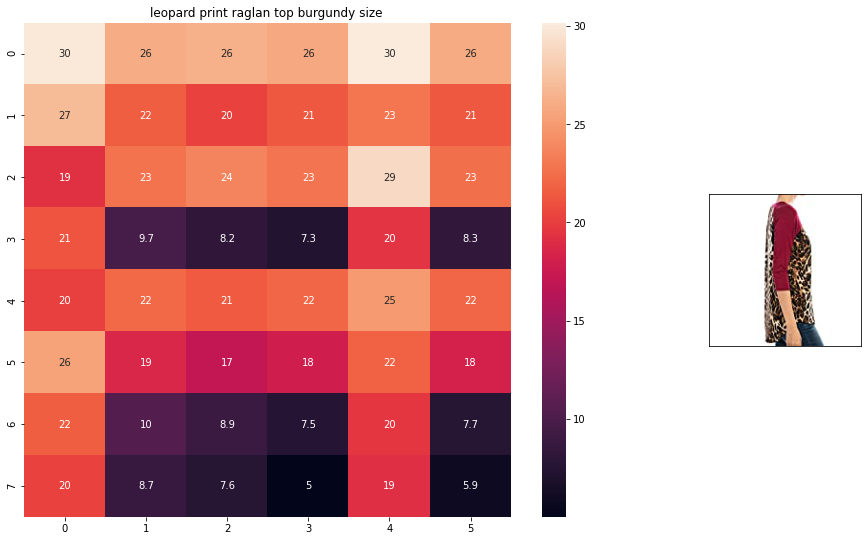

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 6.463409


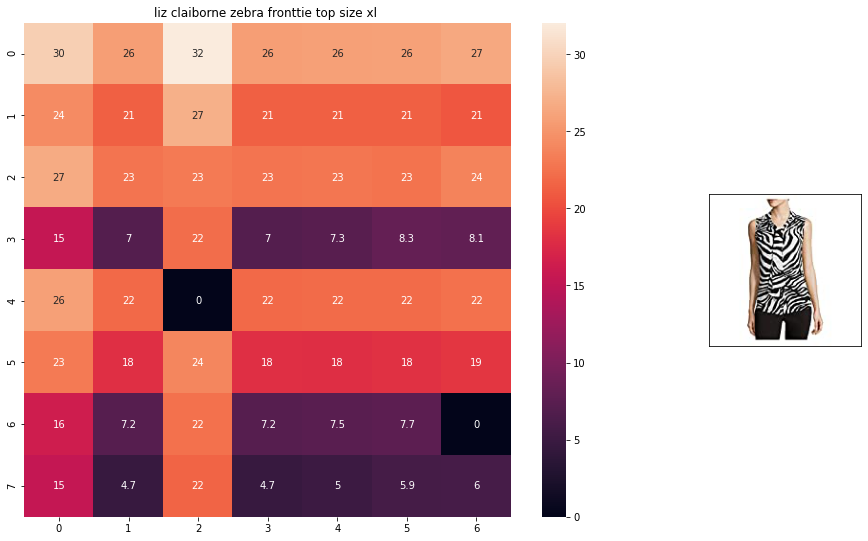

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 6.5392227


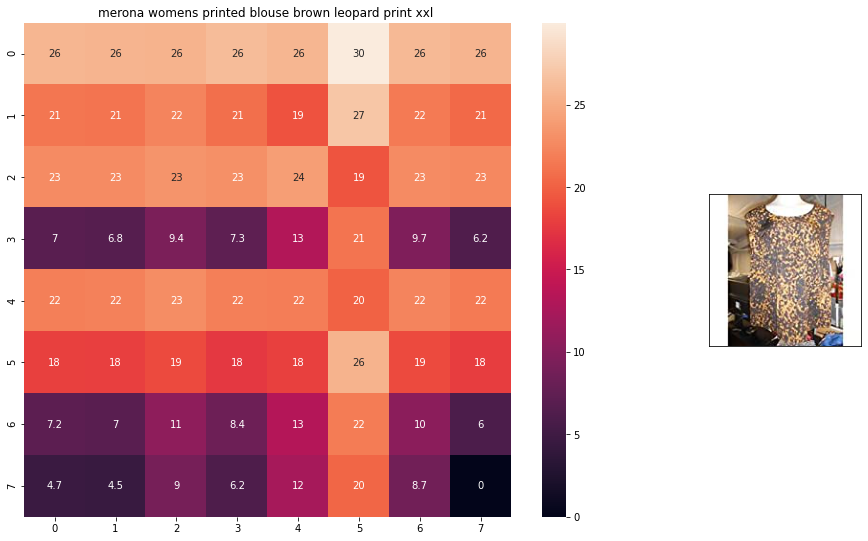

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 6.5755024


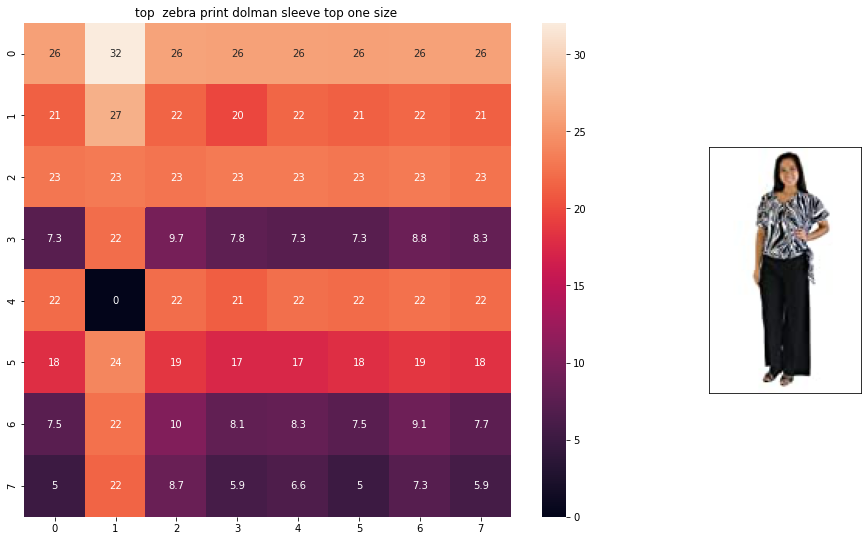

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from input : 6.6382146


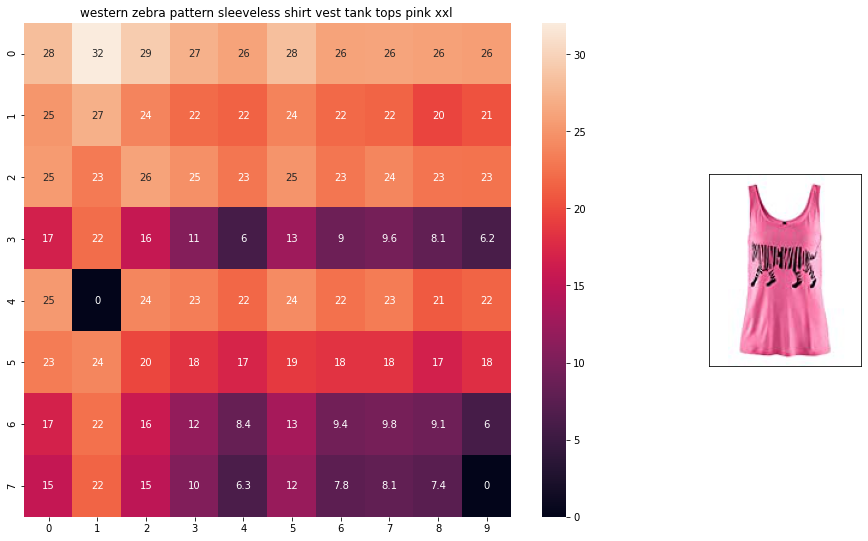

ASIN : B00Z6HEXWI
Brand : Black Temptation
euclidean distance from input : 6.6607366


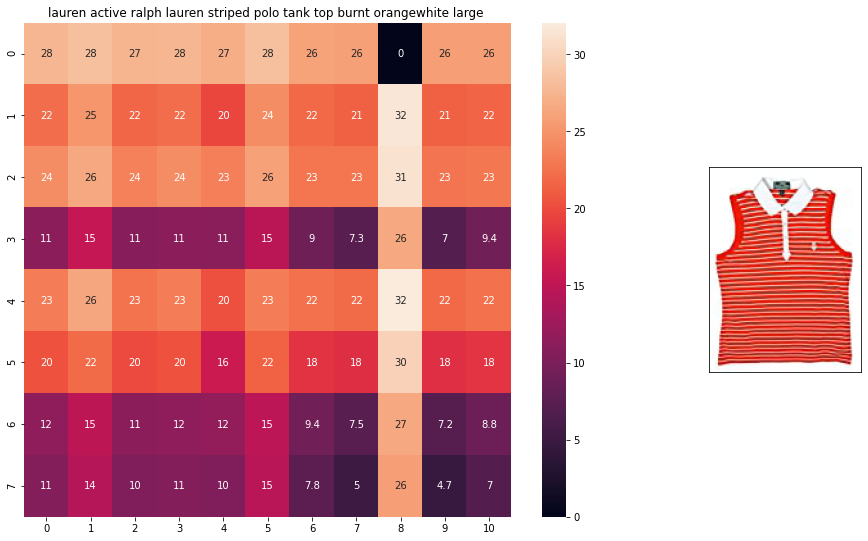

ASIN : B00ILGH5OY
Brand : Ralph Lauren Active
euclidean distance from input : 6.6839046


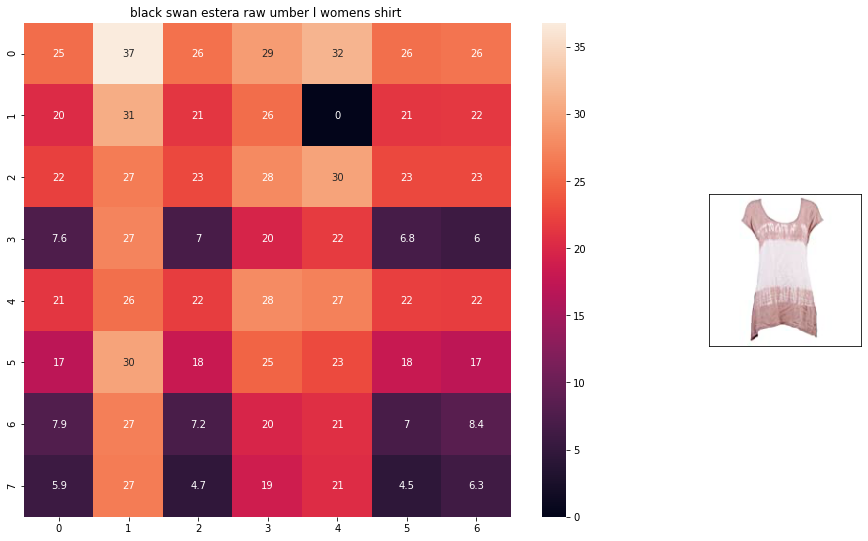

ASIN : B06Y1VN8WQ
Brand : Black Swan
euclidean distance from input : 6.705763


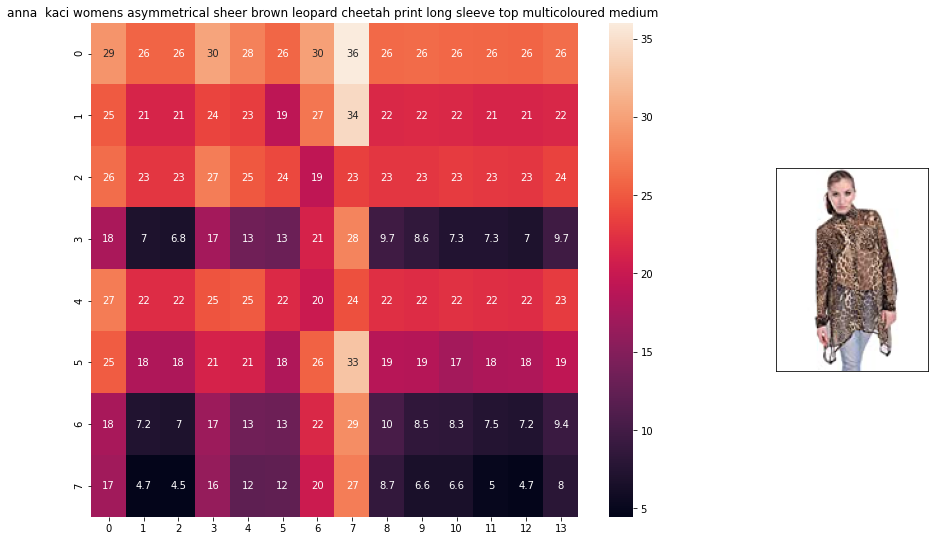

ASIN : B00KSNTY7Y
Brand : Anna-Kaci
euclidean distance from input : 6.7061243


In [38]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

In [39]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [44]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    #ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    #ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    #display_img(url, ax2, fig)
    display_img(url, ax2, fig)
    plt.show()

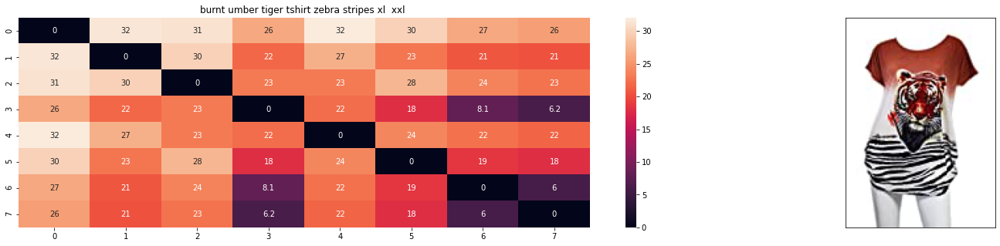

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 8.429369700024835e-08


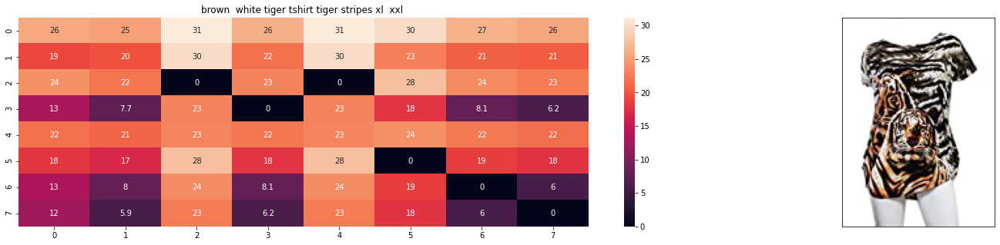

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.3854705810546877


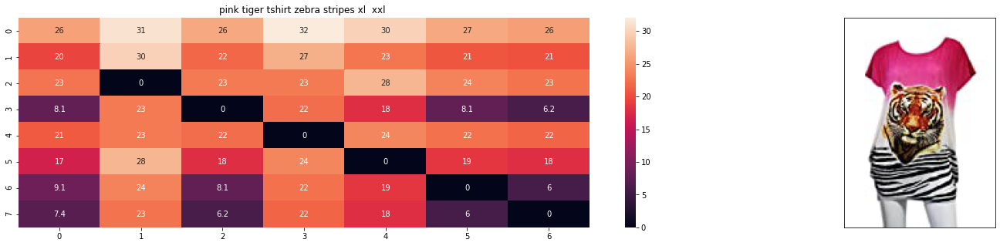

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 2.739050102414575


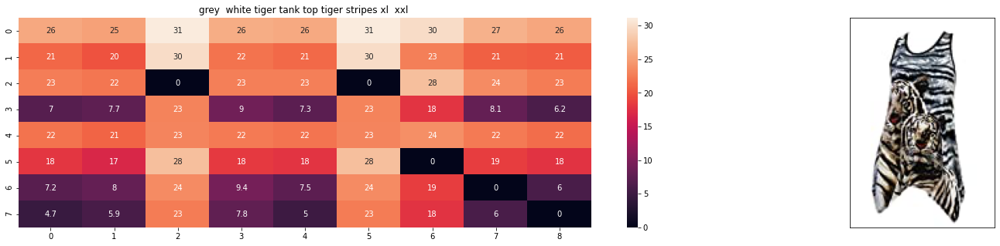

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 3.387187004270044


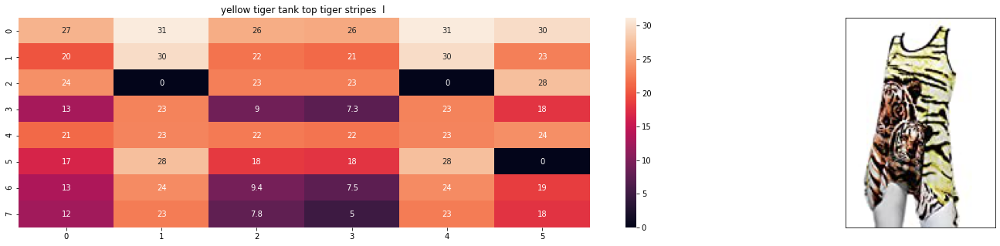

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 3.5518680574316646


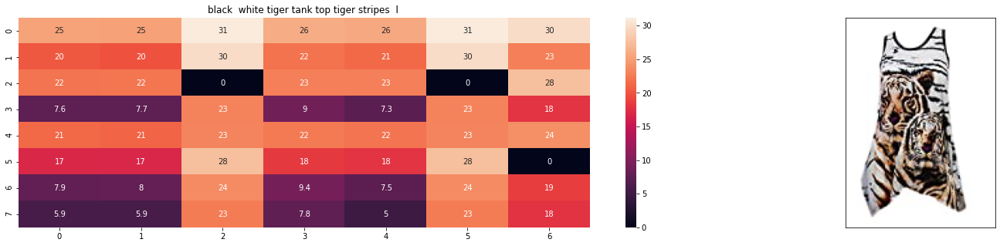

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 3.5536170961279536


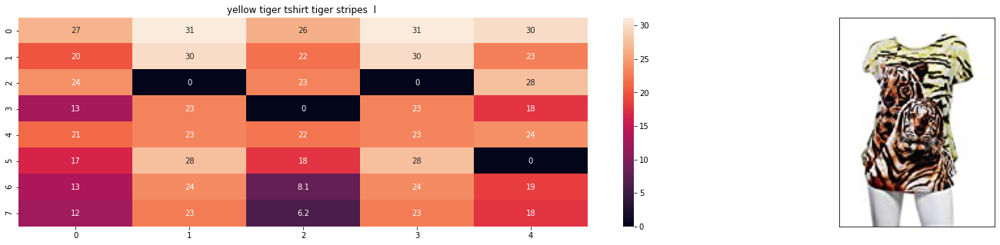

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 3.6538278581518795


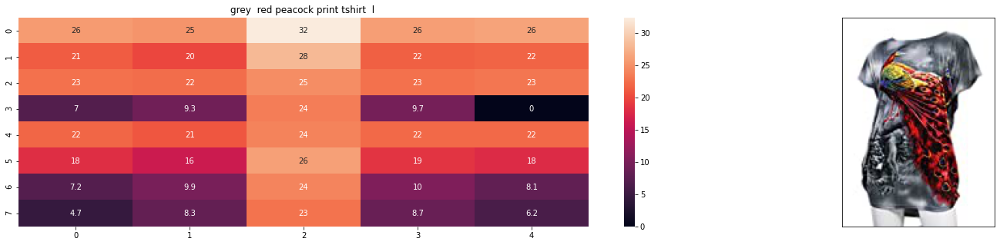

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.128811264218774


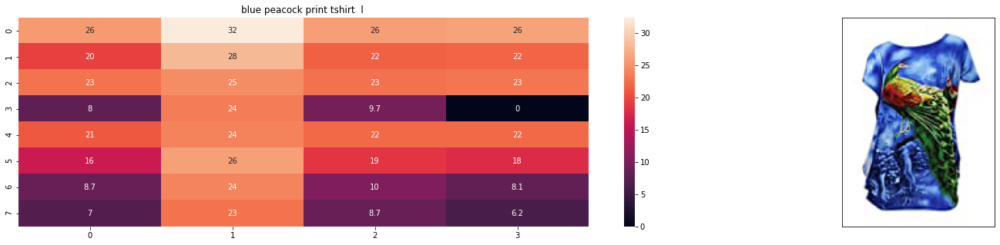

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 4.203900146665063


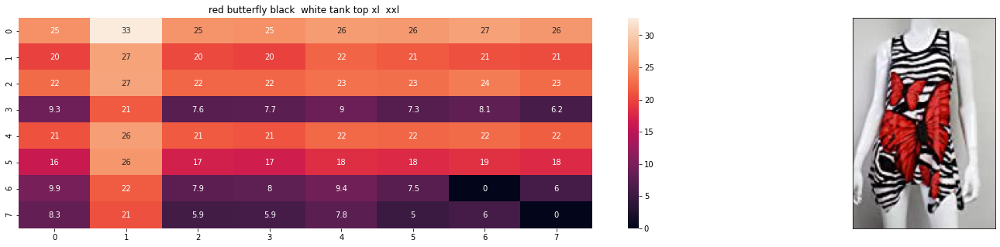

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.286586380185571


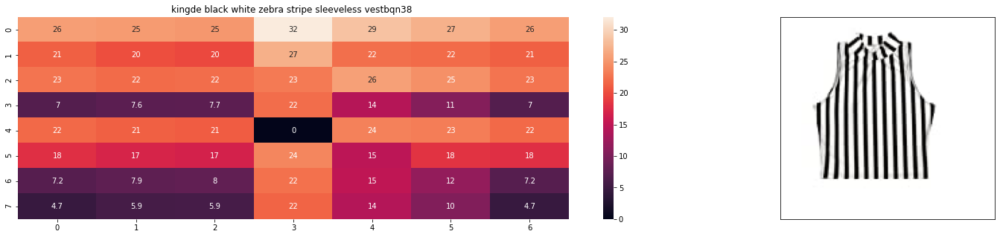

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 4.389370406508858


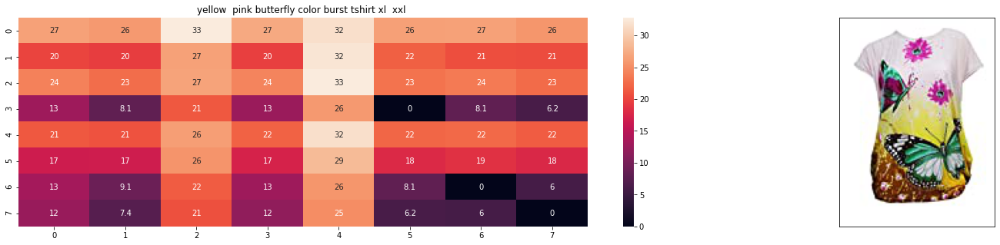

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.397909927548852


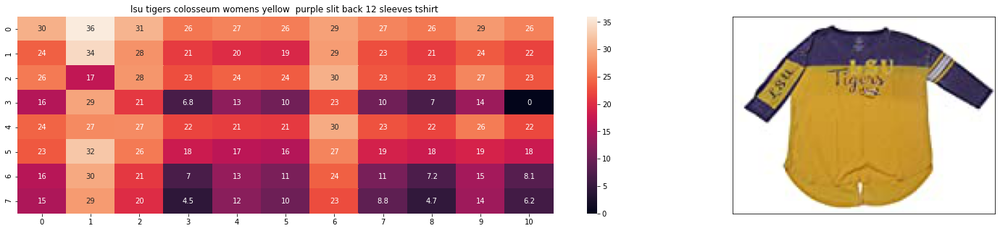

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 4.451228392959053


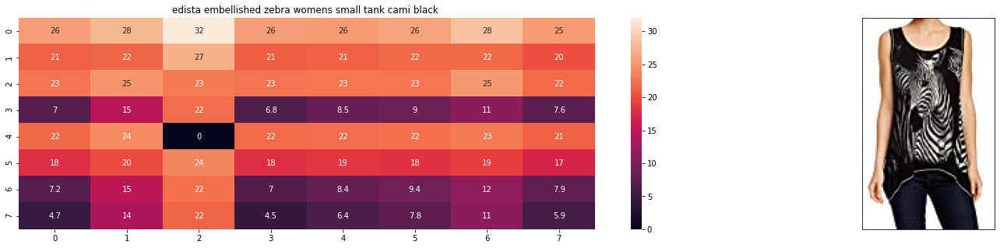

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 4.518977416396553


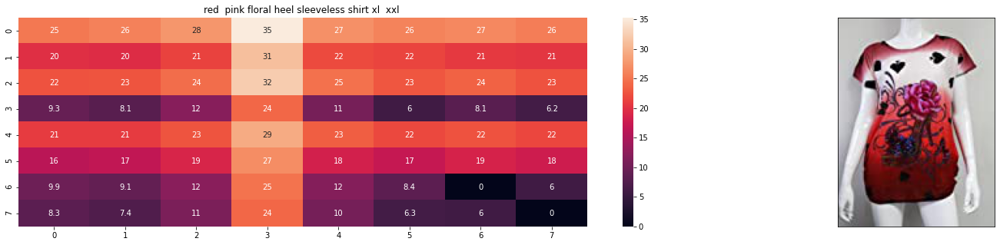

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.529374695004907


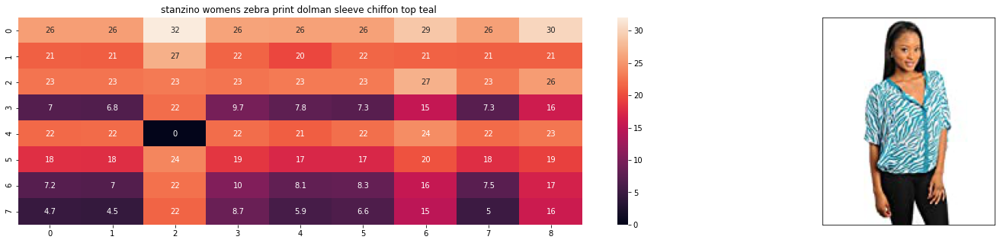

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 4.530325759292061


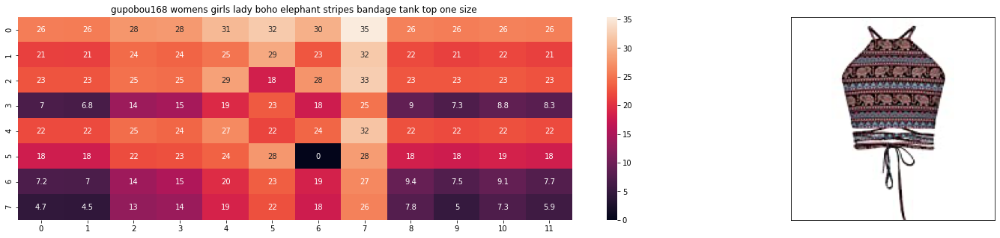

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 4.546816642558488


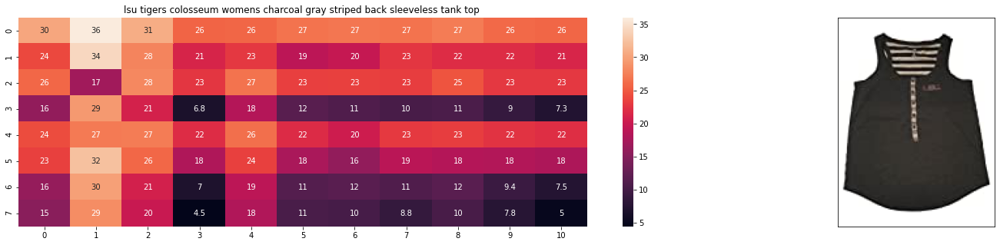

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 4.548355162978584


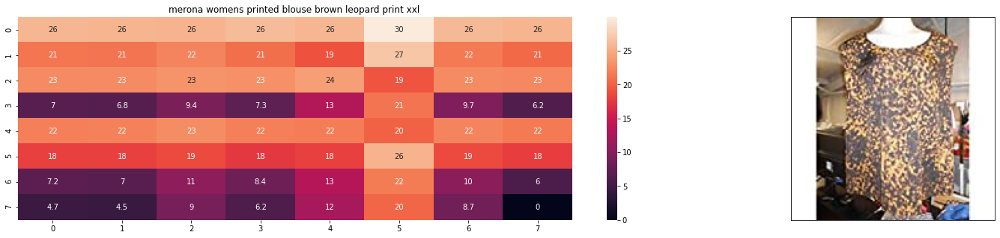

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 4.610626662612374


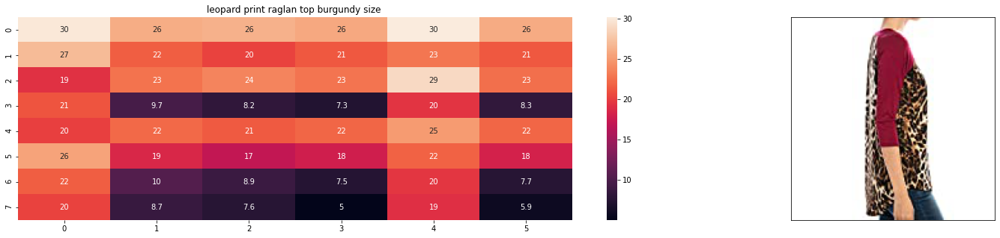

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 4.645917892817431


In [45]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Deep Learning Based Models like VGG-16

In [48]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

In [49]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html



# This code takes 40 minutes to run on a modern GPU (graphics card) 
# like Nvidia  1050.
# GPU (NVidia 1050): 0.175 seconds per image

# This codse takes 160 minutes to run on a high end i7 CPU
# CPU (i7): 0.615 seconds per image.

#Do NOT run this code unless you want to wait a few hours for it to generate output

# each image is converted into 25088 length dense-vector


'''
# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    

save_bottlebeck_features()

'''

"\n# dimensions of our images.\nimg_width, img_height = 224, 224\n\ntop_model_weights_path = 'bottleneck_fc_model.h5'\ntrain_data_dir = 'images2/'\nnb_train_samples = 16042\nepochs = 50\nbatch_size = 1\n\n\ndef save_bottlebeck_features():\n    \n    #Function to compute VGG-16 CNN for image feature extraction.\n    \n    asins = []\n    datagen = ImageDataGenerator(rescale=1. / 255)\n    \n    # build the VGG16 network\n    model = applications.VGG16(include_top=False, weights='imagenet')\n    generator = datagen.flow_from_directory(\n        train_data_dir,\n        target_size=(img_width, img_height),\n        batch_size=batch_size,\n        class_mode=None,\n        shuffle=False)\n\n    for i in generator.filenames:\n        asins.append(i[2:-5])\n\n    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)\n    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))\n    \n    np.save(open('16k_data_cnn_features.npy', 'w

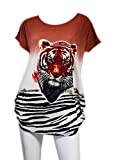

Product Title:  burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 0.0
Amazon Url: www.amzon.com/dp/B00JXQB5FQ


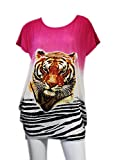

Product Title:  pink tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 30.05017
Amazon Url: www.amzon.com/dp/B00JXQASS6


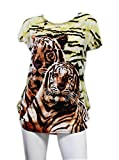

Product Title:  yellow tiger tshirt tiger stripes  l 
Euclidean Distance from input image: 41.261116
Amazon Url: www.amzon.com/dp/B00JXQCUIC


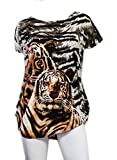

Product Title:  brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean Distance from input image: 44.000156
Amazon Url: www.amzon.com/dp/B00JXQCWTO


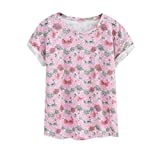

Product Title:  kawaii pastel tops tees pink flower design 
Euclidean Distance from input image: 47.38248
Amazon Url: www.amzon.com/dp/B071FCWD97


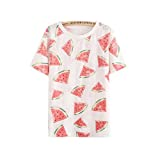

Product Title:  womens thin style tops tees pastel watermelon print 
Euclidean Distance from input image: 47.71842
Amazon Url: www.amzon.com/dp/B01JUNHBRM


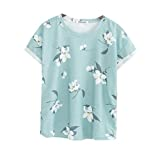

Product Title:  kawaii pastel tops tees baby blue flower design 
Euclidean Distance from input image: 47.90206
Amazon Url: www.amzon.com/dp/B071SBCY9W


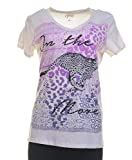

Product Title:  edv cheetah run purple multi xl 
Euclidean Distance from input image: 48.046482
Amazon Url: www.amzon.com/dp/B01CUPYBM0


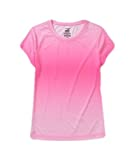

Product Title:  danskin womens vneck loose performance tee xsmall pink ombre 
Euclidean Distance from input image: 48.101837
Amazon Url: www.amzon.com/dp/B01F7PHXY8


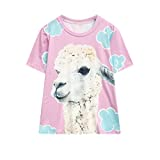

Product Title:  summer alpaca 3d pastel casual loose tops tee design 
Euclidean Distance from input image: 48.118866
Amazon Url: www.amzon.com/dp/B01I80A93G


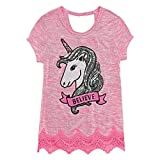

Product Title:  miss chievous juniors striped peplum tank top medium shadowpeach 
Euclidean Distance from input image: 48.13122
Amazon Url: www.amzon.com/dp/B0177DM70S


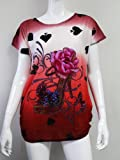

Product Title:  red  pink floral heel sleeveless shirt xl  xxl 
Euclidean Distance from input image: 48.16945
Amazon Url: www.amzon.com/dp/B00JV63QQE


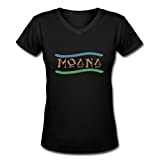

Product Title:  moana logo adults hot v neck shirt black xxl 
Euclidean Distance from input image: 48.256786
Amazon Url: www.amzon.com/dp/B01LX6H43D


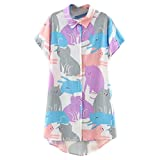

Product Title:  abaday multicolor cartoon cat print short sleeve longline shirt large 
Euclidean Distance from input image: 48.265686
Amazon Url: www.amzon.com/dp/B01CR57YY0


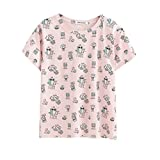

Product Title:  kawaii cotton pastel tops tees peach pink cactus design 
Euclidean Distance from input image: 48.362602
Amazon Url: www.amzon.com/dp/B071WYLBZS


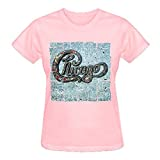

Product Title:  chicago chicago 18 shirt women pink 
Euclidean Distance from input image: 48.383606
Amazon Url: www.amzon.com/dp/B01GXAZTRY


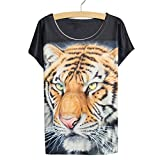

Product Title:  yichun womens tiger printed summer tshirts tops 
Euclidean Distance from input image: 48.449356
Amazon Url: www.amzon.com/dp/B010NN9RXO


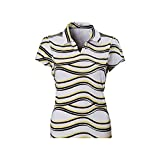

Product Title:  nancy lopez whimsy short sleeve  whiteblacklemon drop  xs 
Euclidean Distance from input image: 48.47889
Amazon Url: www.amzon.com/dp/B01MPX6IDX


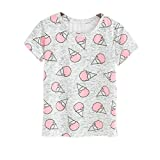

Product Title:  womens tops tees pastel peach ice cream cone print 
Euclidean Distance from input image: 48.557957
Amazon Url: www.amzon.com/dp/B0734GRKZL


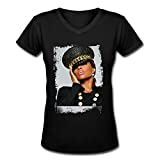

Product Title:  uswomens mary j blige without tshirts shirt 
Euclidean Distance from input image: 48.614372
Amazon Url: www.amzon.com/dp/B01M0XXFKK


In [50]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
#data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 20)



In [52]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy') 
#shape = (16042, 25088) 
asins = np.load('16k_data_cnn_feature_asins.npy') 
asins = list(asins) 
data = pd.read_pickle('16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [107]:
def heat_map_idf_brand_col_img(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model): 
    # sentance1 : title1, input apparel 
    # sentance2 : title2, recommended apparel 
    # url: apparel image url 
    # doc_id1: document id of input apparel 
    # doc_id2: document id of recommended apparel 
    # df_id1: index of document1 in the data frame 
    # df_id2: index of document2 in the data frame 
    # model: it can have two values, 1. avg 2. weighted 
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title 
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model) 
    # s1_s2_dist = np.array(#number of words in title1 *
    #number of words in title2) # s1_s2_dist[i,j] = euclidean distance between words i, j
    
    
    s1_s2_dist = get_distance(s1_vec, s2_vec)
    #Create a table #create_table(df_id1, df_id2, doc_id1,doc_id2) 
    '''Extremely high ram consumption. Try to avoid running the above line'''
    # devide whole figure space into 25 * 1:10 grids 
    gs = gridspec.GridSpec(25, 15) 
    fig = plt.figure(figsize=(25,5))
    # in first 25*10 grids we plot heatmap 
    ax1 = plt.subplot(gs[:, :-5]) 
    # ploting the heap map based on the pairwise distances 
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    #ax1.set_xticklabels(sentance2.split()) 
    # set the y axis labels as input apparels title 
    #ax1.set_yticklabels(sentance1.split()) 
    # set title as recommended apparels title
    ax1.set_title(sentance2) 
    # in last 25 * 10:15 grids we display image 

    # pass the url it display it 
    #display_img(url,ax2,fig) 
    display(Image(url=url))
    plt.show()  


In [108]:
def idf_w2v_brand_col_visual(doc_id, w1, w2, w3, w4, num_results): 
    # doc_id: apparel's id in given corpus 
    # w1: weight for w2v features 
    # w2: weight for brand features 
    # w3: weight for color features 
    # w4: weight for cnn features 
    # pairwise_dist will store the distance from given input apparel to all remaining apparels 
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*|| Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity 
    # For Title i
    idf_w2v_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    # For Brand 
    brand_feat_dist = pairwise_distances(brand_features, brand_features[doc_id].reshape(1,-1)) 
    # For Color 
    col_feat_dist = pairwise_distances(color_features, color_features[doc_id].reshape(1,-1)) 
    # For Image 
    cnn_feat_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    # Weighted Eucledean Distance 
    pairwise_dist = (w1*idf_w2v_dist + w2*brand_feat_dist + w3*col_feat_dist + w4*cnn_feat_dist)/float(w1 + w2 + w3 +w4)
    # np.argsort will return indices of 20 smallest distances 
    indices = np.argsort(pairwise_dist.flatten())[0:num_results] 
    #pdists will store the 9 smallest distances 
    pdists = np.sort(pairwise_dist.flatten())[0:num_results] 
    #data frame indices of the 9 smallest distace's 
    df_indices = list(data.index[indices]) 
    for i in range(0, len(indices)):
        heat_map_idf_brand_col_img(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted') 
        print('ASIN :',data['asin'].loc[df_indices[i]]) 
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('Color :',data['color'].loc[df_indices[i]]) 
        print('Product Type : ',data['product_type_name'].loc[df_indices[i]]) 
        print('Euclidean distance from input :', pdists[i]) 
        print('='*125)

# More Preference to title

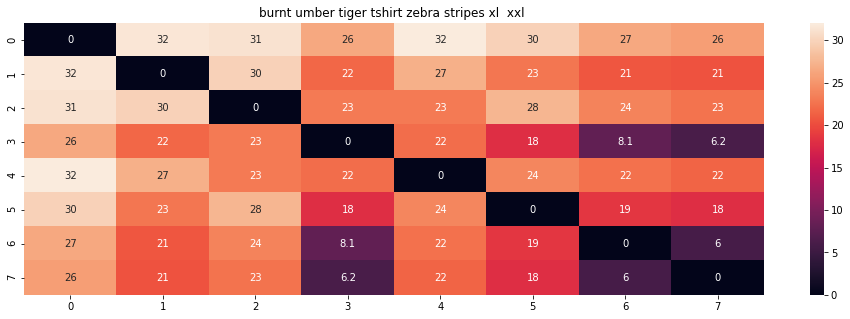

ASIN : B00JXQB5FQ
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 1.2968261076961286e-07


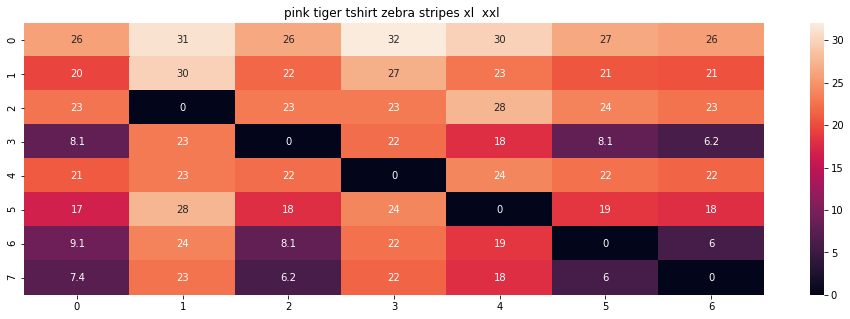

ASIN : B00JXQASS6
Brand : Si Row
Color : Pink
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 6.966376319326176


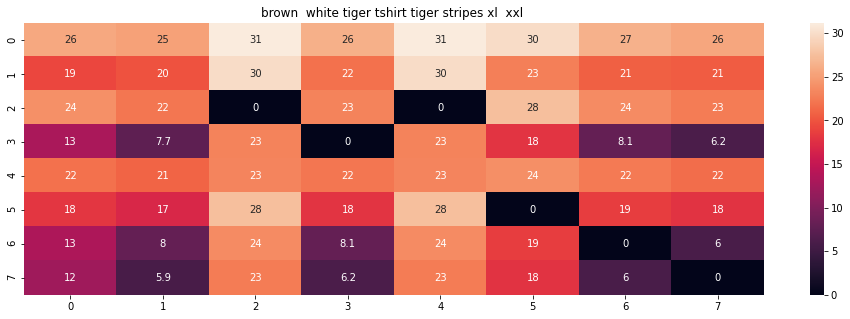

ASIN : B00JXQCWTO
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 7.9428659292367785


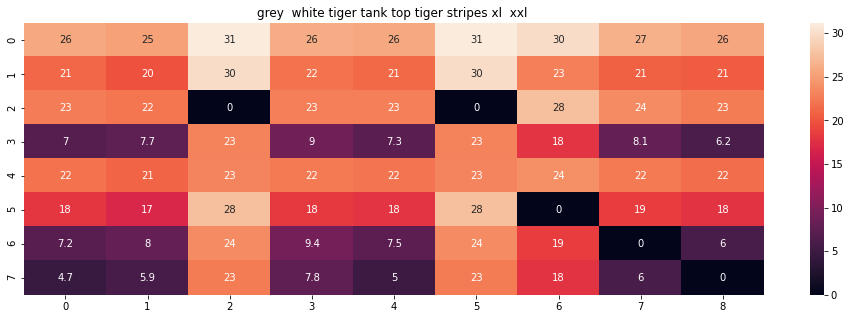

ASIN : B00JXQAFZ2
Brand : Si Row
Color : Grey
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 8.380186931931345


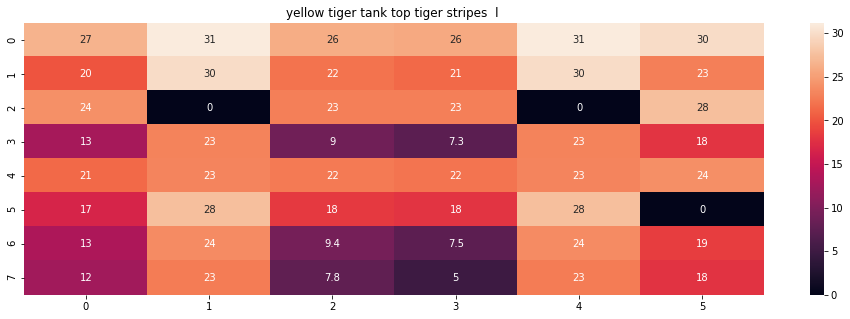

ASIN : B00JXQAUWA
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 8.599102665855623


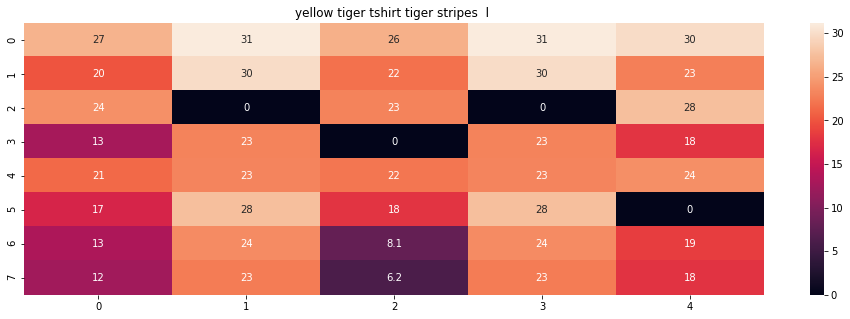

ASIN : B00JXQCUIC
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 8.65582310605995


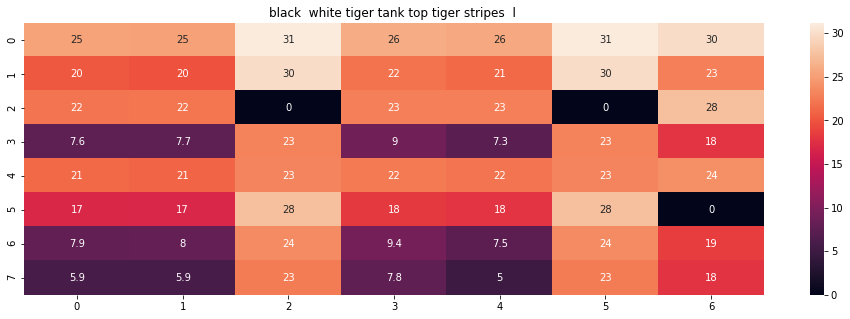

ASIN : B00JXQAO94
Brand : Si Row
Color : White
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 8.736441157442162


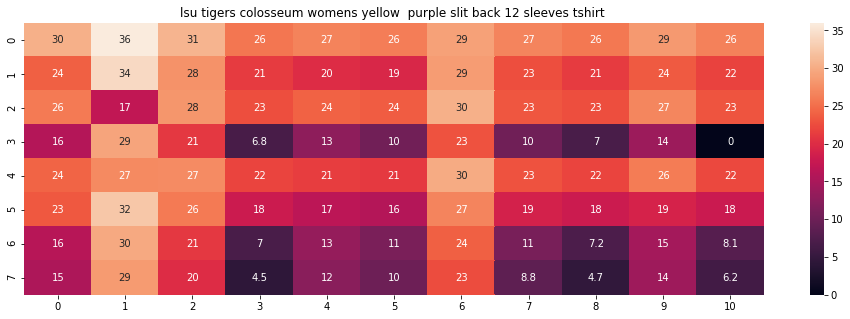

ASIN : B073R5Q8HD
Brand : Colosseum
Color : Yellow
Product Type :  SPORTING_GOODS
Euclidean distance from input : 8.864317652480512


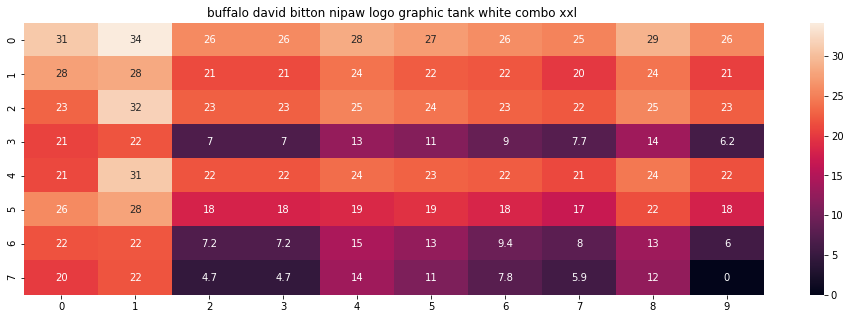

ASIN : B018H5AZXQ
Brand : Buffalo
Color : White Combo
Product Type :  SHIRT
Euclidean distance from input : 9.018322476254585


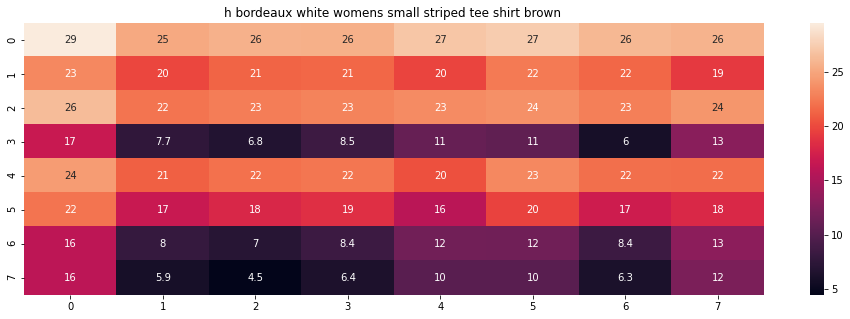

ASIN : B072BVB47Z
Brand : H By Bordeaux
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 9.15569082406851


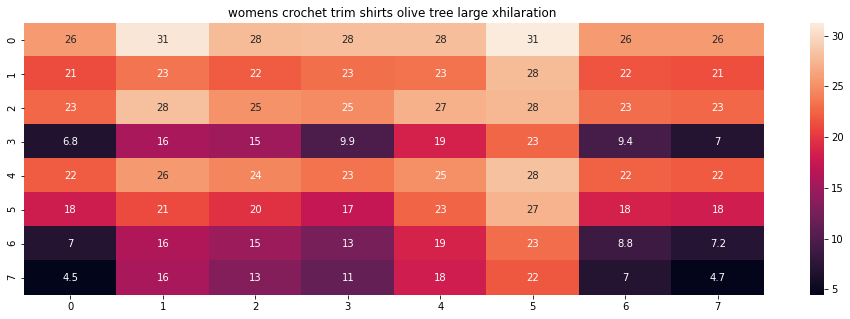

ASIN : B06XBHNM7J
Brand : Xhilaration
Color : Olive Tree
Product Type :  SHIRT
Euclidean distance from input : 9.228254539430669


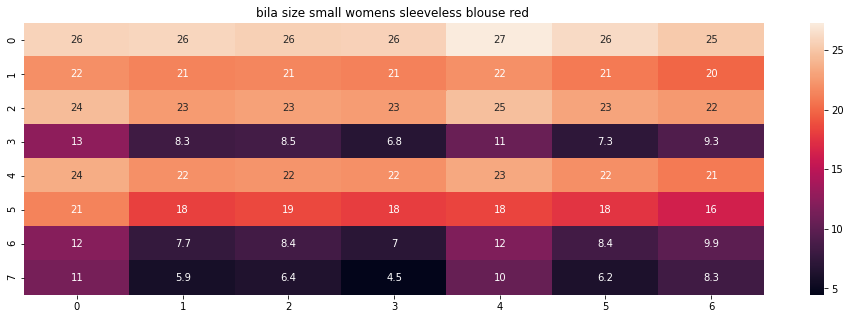

ASIN : B01L7ROZNC
Brand : Bila
Color : Red
Product Type :  SHIRT
Euclidean distance from input : 9.246490926594094


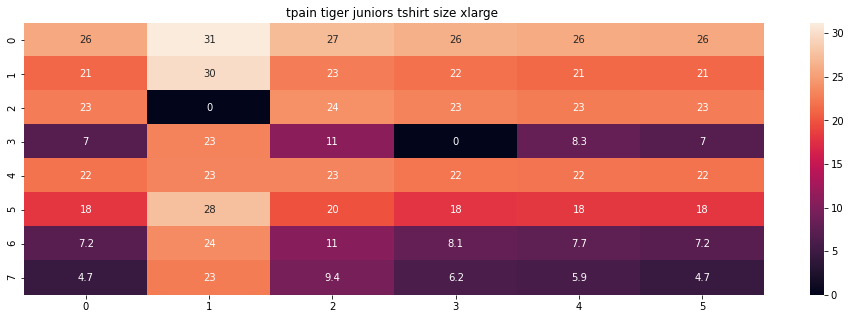

ASIN : B01K0H02OG
Brand : Tultex
Color : Black
Product Type :  SHIRT
Euclidean distance from input : 9.25397313249854


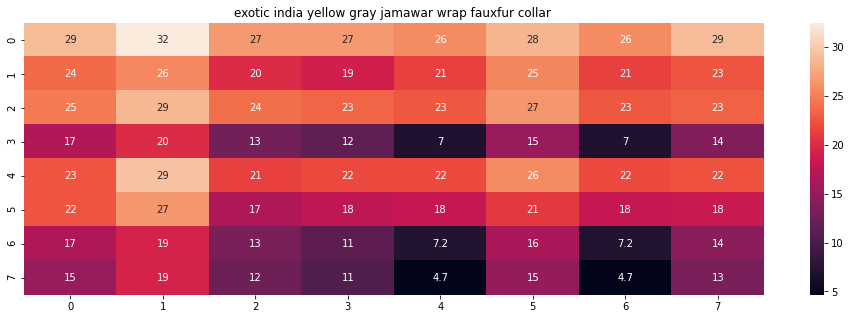

ASIN : B073ZHRBV8
Brand : Exotic India
Color : Gray
Product Type :  SHIRT
Euclidean distance from input : 9.285452857412114


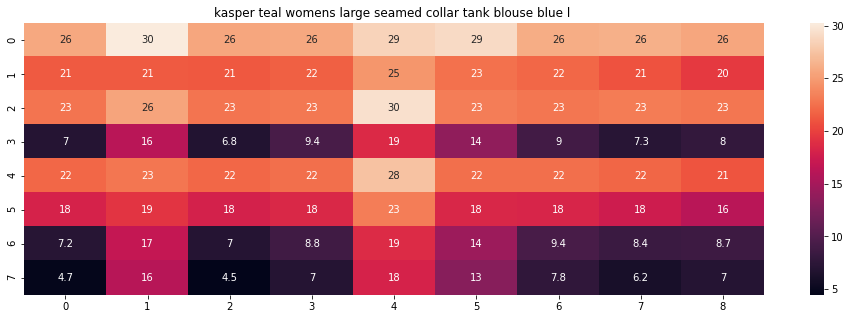

ASIN : B0722DJVQP
Brand : Kasper
Color : Blue
Product Type :  SHIRT
Euclidean distance from input : 9.330123645193853


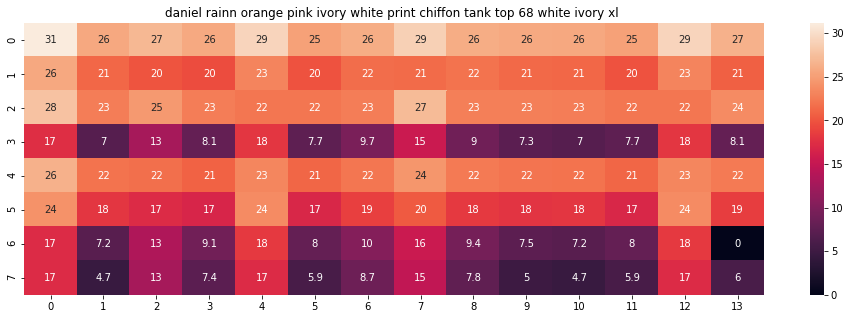

ASIN : B01IPV1SFQ
Brand : Daniel Rainn
Color : White Ivory
Product Type :  SHIRT
Euclidean distance from input : 9.330931774109866


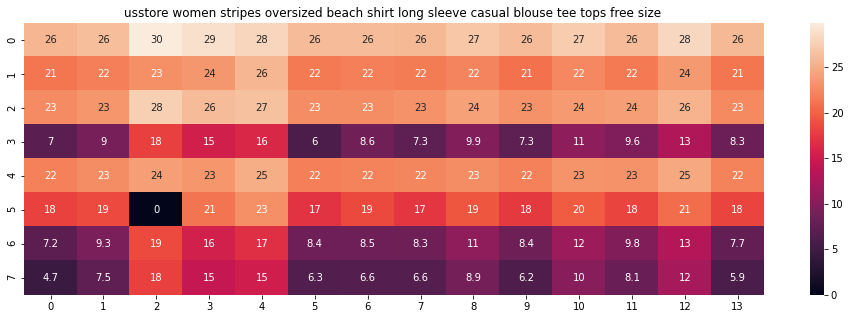

ASIN : B01DNNI1RO
Brand : Usstore
Color : as pictures
Product Type :  SHIRT
Euclidean distance from input : 9.350650920515404


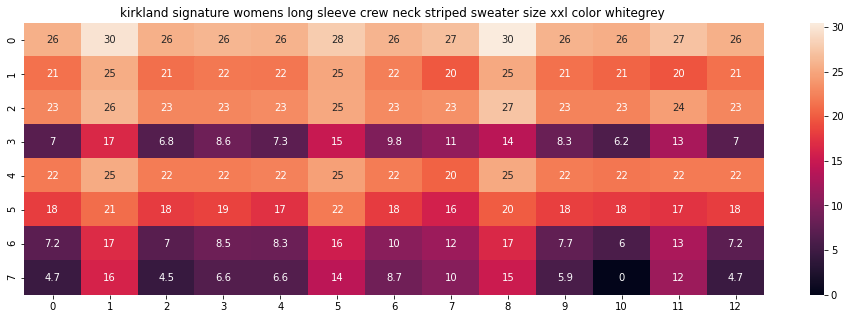

ASIN : B06XTPC3FP
Brand : Kirkland Signature
Color : White
Product Type :  SWEATER
Euclidean distance from input : 9.352018972571368


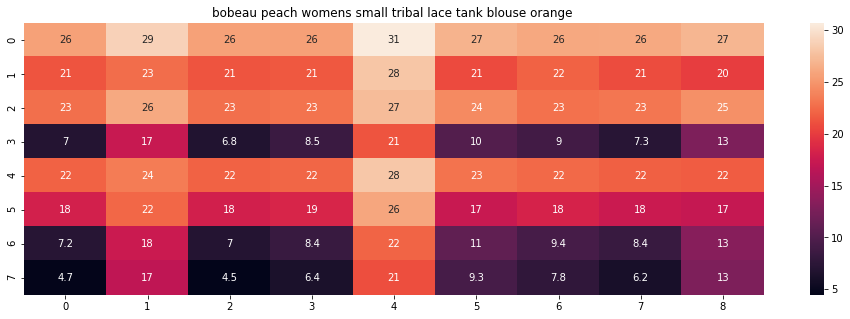

ASIN : B072JTHCX6
Brand : Bobeau
Color : Orange
Product Type :  SHIRT
Euclidean distance from input : 9.383375645268973


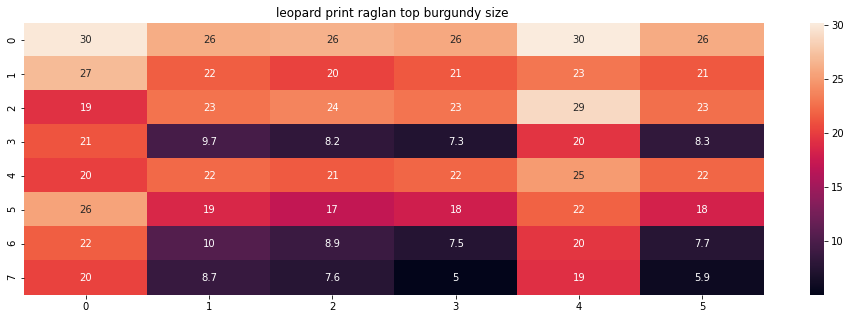

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
Color : Burgundy
Product Type :  SHIRT
Euclidean distance from input : 9.384760343139277


In [109]:
idf_w2v_brand_col_visual(12566, 50, 5, 5, 5, 20)

## <b>Summary:
    
    1.Here we are giving more weight to titles, it works according to titles <br>
    2.As we go down the similarity decreases, results are getting bad

## Perference to Brands


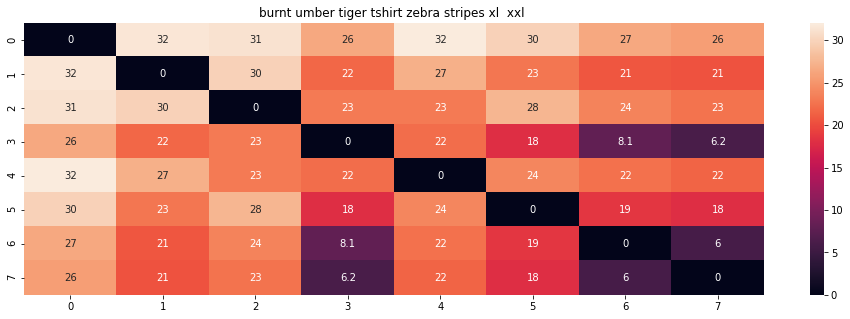

ASIN : B00JXQB5FQ
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 1.2968261076961286e-08


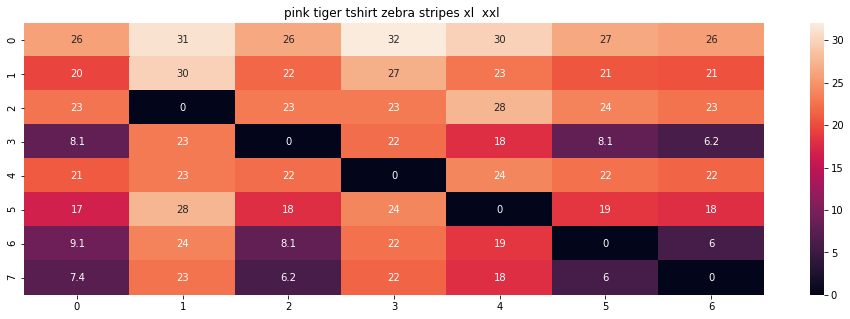

ASIN : B00JXQASS6
Brand : Si Row
Color : Pink
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.152916277399719


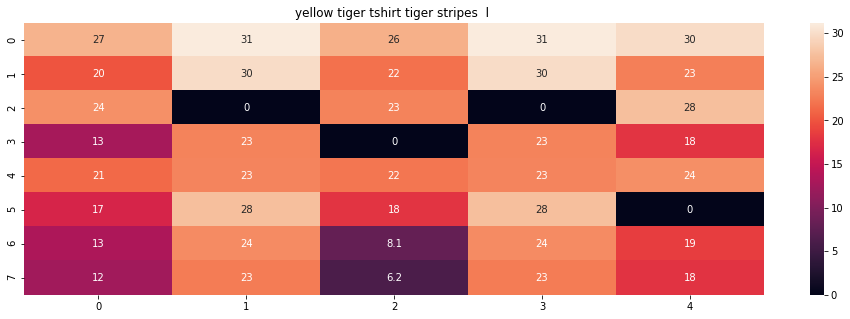

ASIN : B00JXQCUIC
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.575747592660385


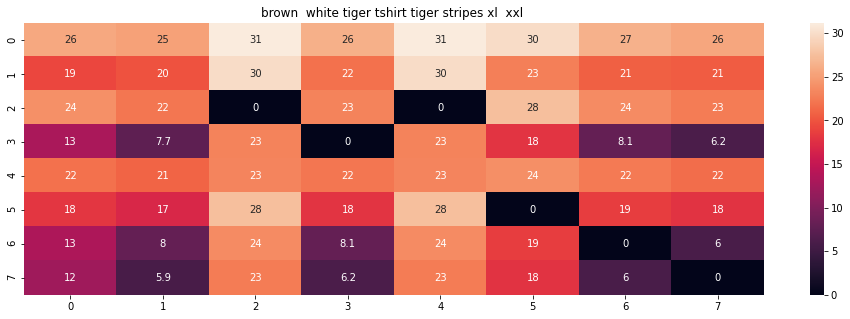

ASIN : B00JXQCWTO
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.6399066631610575


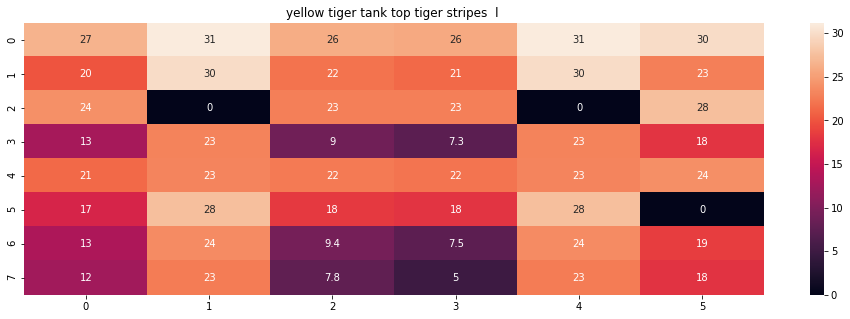

ASIN : B00JXQAUWA
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.660202319833237


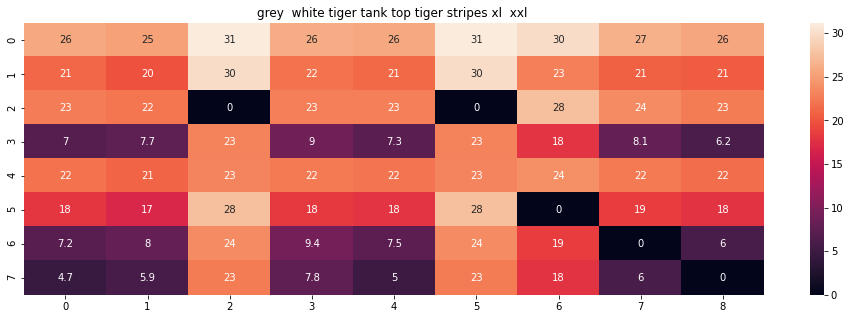

ASIN : B00JXQAFZ2
Brand : Si Row
Color : Grey
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.669306564358853


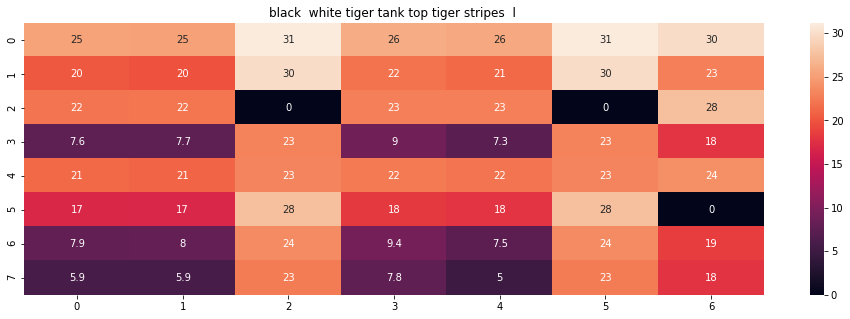

ASIN : B00JXQAO94
Brand : Si Row
Color : White
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.795119182907906


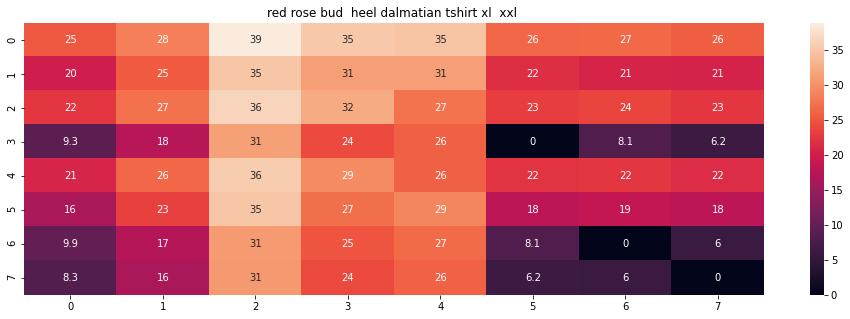

ASIN : B00JXQABB0
Brand : Si Row
Color : Red
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.910503622229571


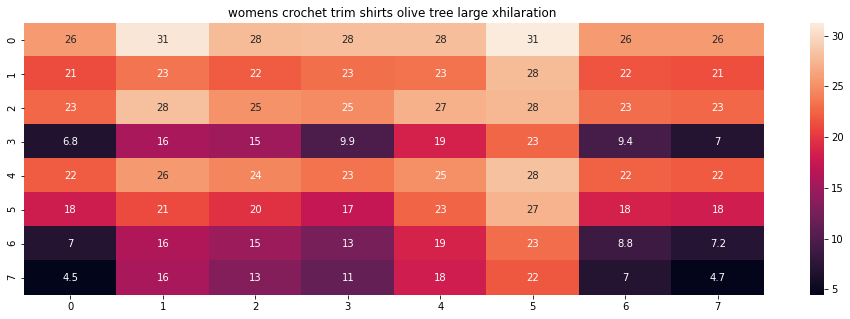

ASIN : B06XBHNM7J
Brand : Xhilaration
Color : Olive Tree
Product Type :  SHIRT
Euclidean distance from input : 4.936298017030185


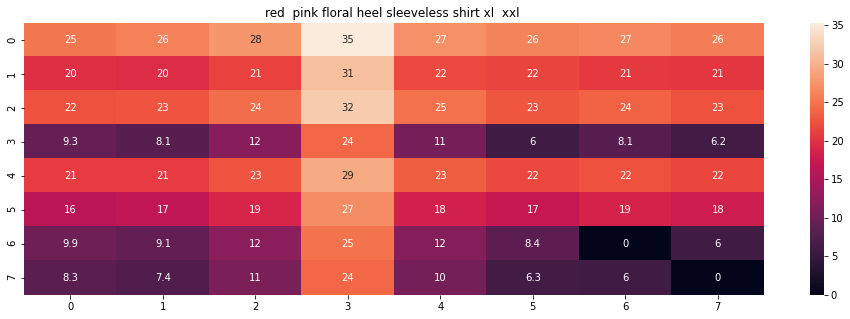

ASIN : B00JV63QQE
Brand : Si Row
Color : Red
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.9645852896161395


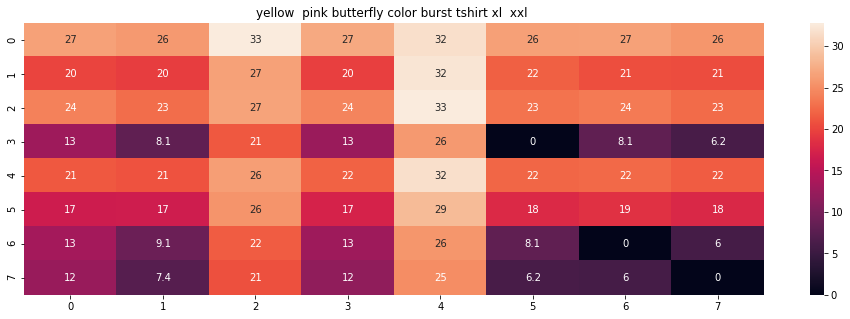

ASIN : B00JXQBBMI
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.994199840866891


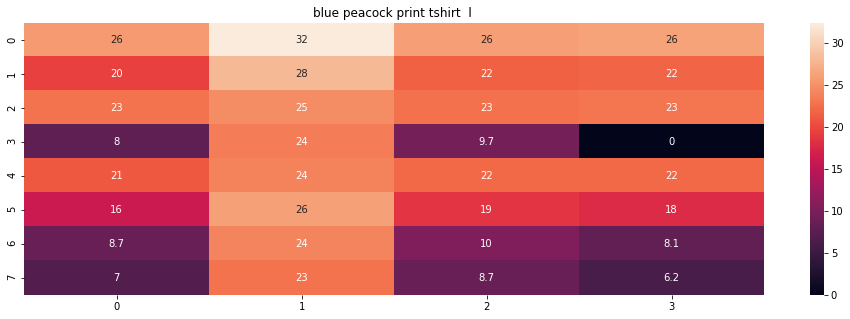

ASIN : B00JXQC8L6
Brand : Si Row
Color : Blue
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.0682692307970285


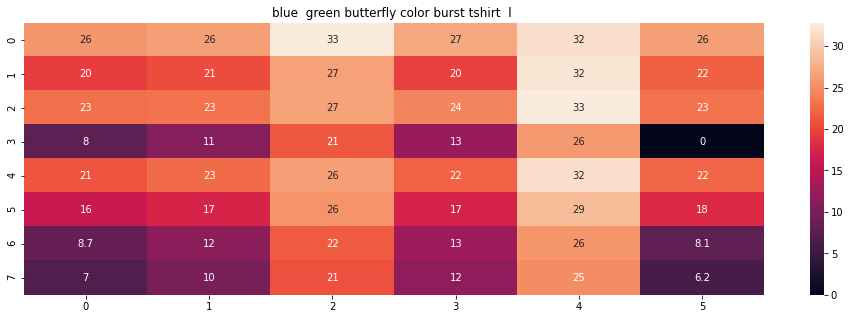

ASIN : B00JXQC0C8
Brand : Si Row
Color : Blue
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.074921710702378


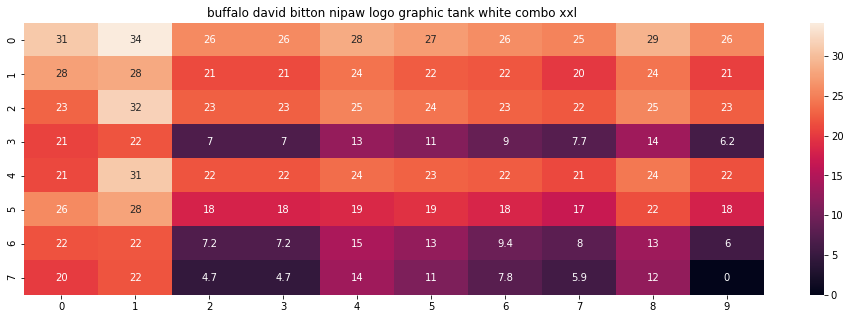

ASIN : B018H5AZXQ
Brand : Buffalo
Color : White Combo
Product Type :  SHIRT
Euclidean distance from input : 5.079679928087877


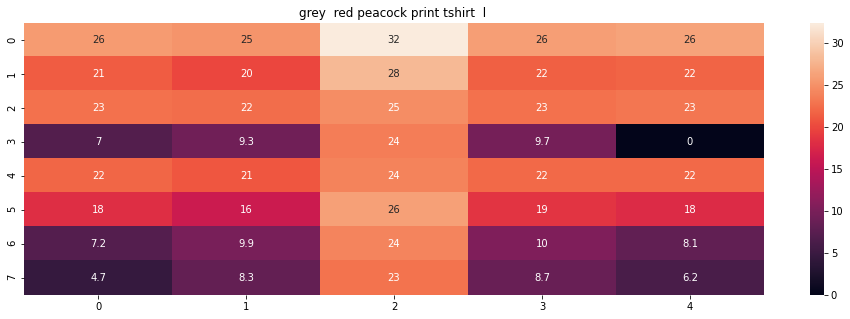

ASIN : B00JXQCFRS
Brand : Si Row
Color : Grey
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.152340404831734


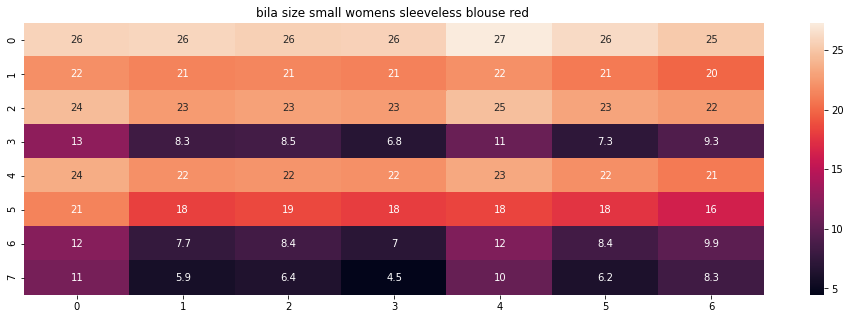

ASIN : B01L7ROZNC
Brand : Bila
Color : Red
Product Type :  SHIRT
Euclidean distance from input : 5.1825640367619705


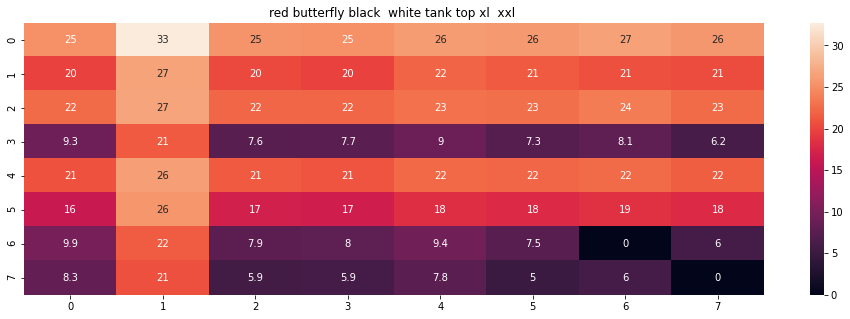

ASIN : B00JV63CW2
Brand : Si Row
Color : Red
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.2101790795237415


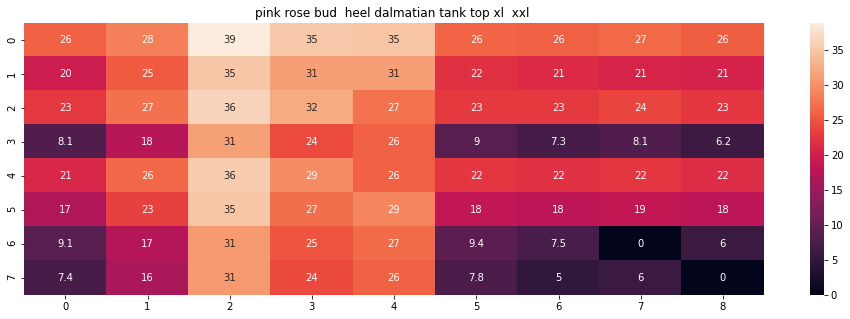

ASIN : B00JXQAX2C
Brand : Si Row
Color : Pink
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.2688980102817045


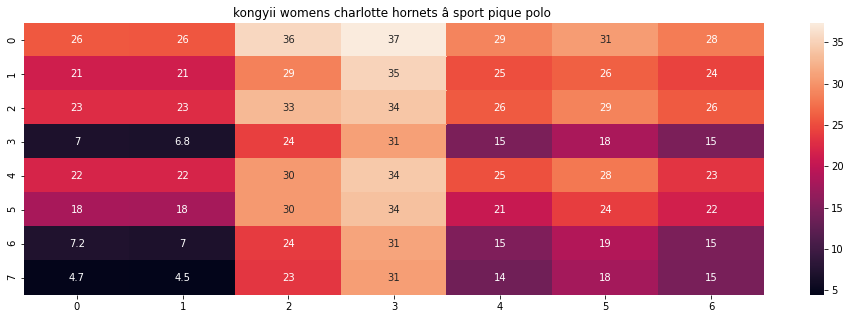

ASIN : B01FJVZST2
Brand : KONGYII
Color : White
Product Type :  SHIRT
Euclidean distance from input : 5.288002679997397


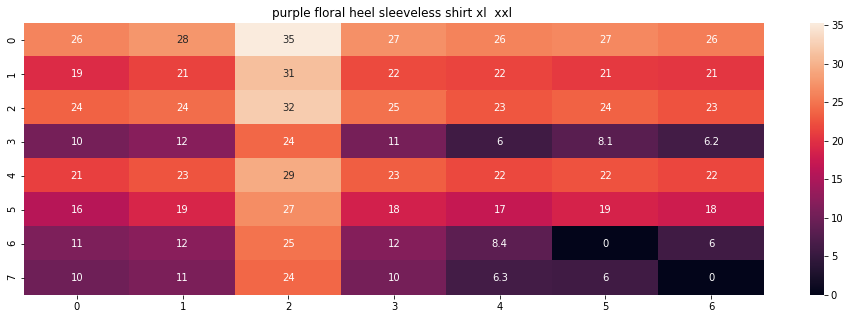

ASIN : B00JV63VC8
Brand : Si Row
Color : Purple
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.289708768432245


In [110]:
idf_w2v_brand_col_visual(12566, 5, 50, 5, 5, 20)

## <b>Summary:
    
    1.Here we are giving more weight to titles, it works according to brands <br>
    2.As we go down the similarity decreases, results are getting bad

## Perference to colour

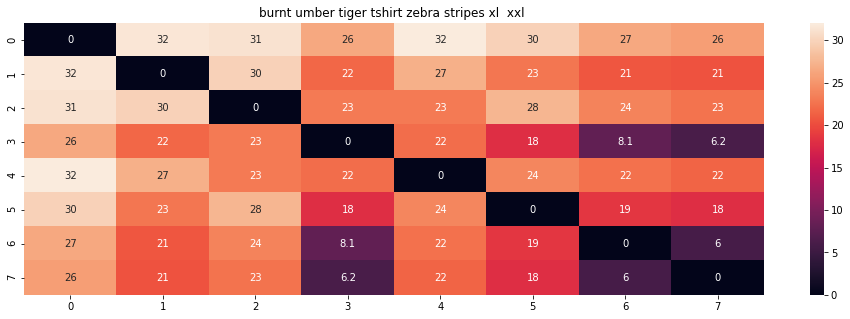

ASIN : B00JXQB5FQ
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 1.2968261076961286e-08


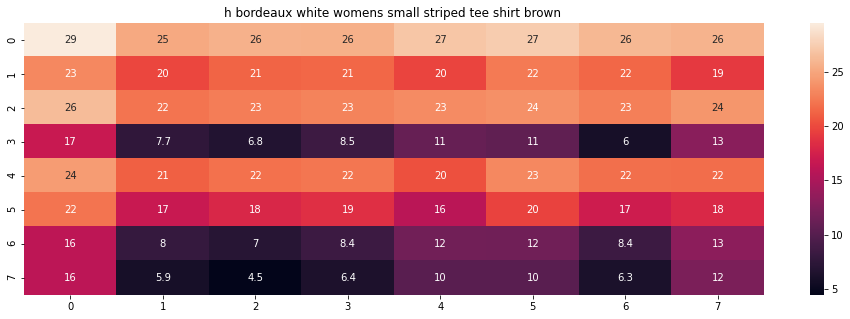

ASIN : B072BVB47Z
Brand : H By Bordeaux
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.217425947922926


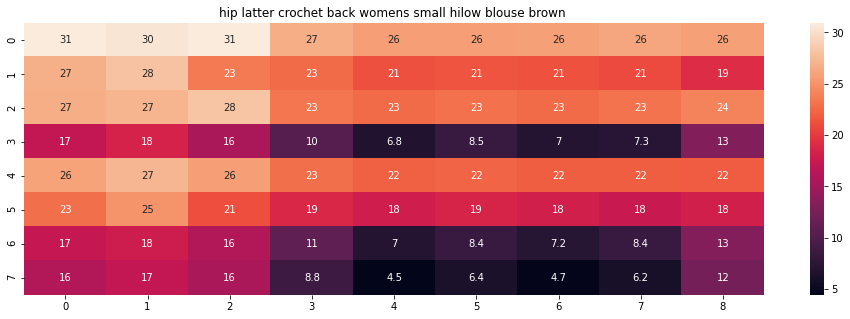

ASIN : B074MJN1K9
Brand : Hip
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.2751901265362475


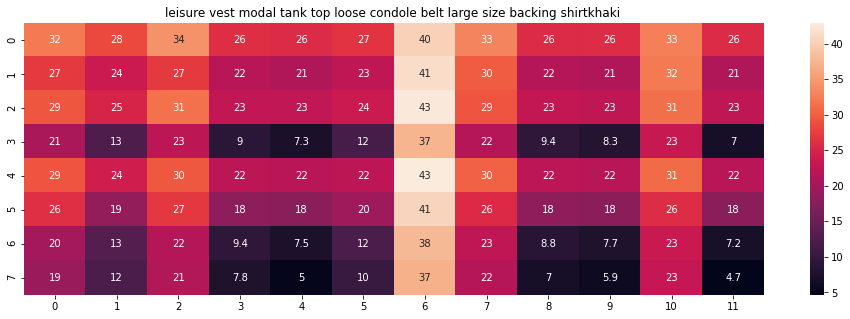

ASIN : B014OUHUZY
Brand : Black Temptation
Color : Brown
Product Type :  BLAZER
Euclidean distance from input : 4.488368577223557


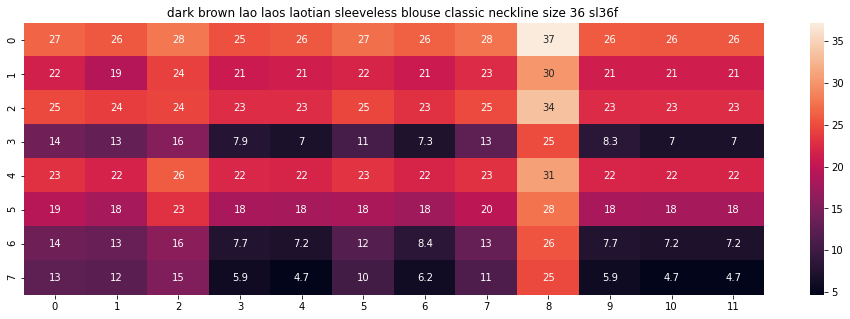

ASIN : B074J7BCYM
Brand : Nanon
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.601976930735466


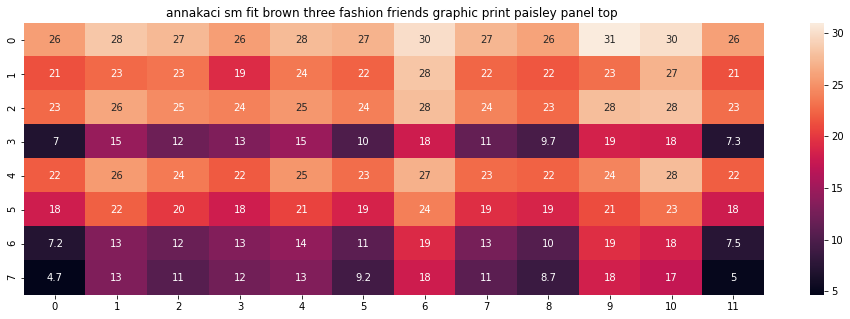

ASIN : B00BTJKAQ0
Brand : Anna-Kaci
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.620630469689003


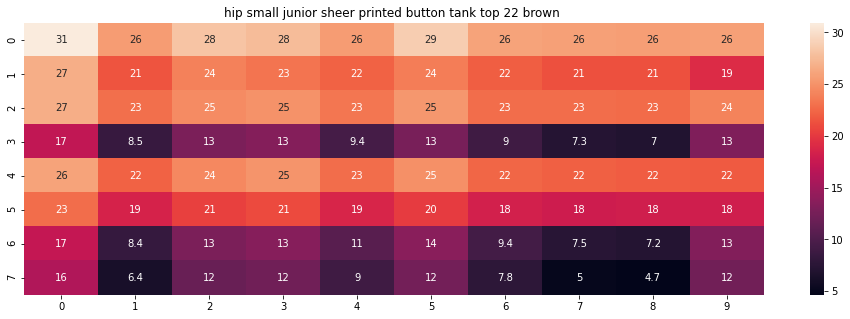

ASIN : B071LDTQ1F
Brand : Hip
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.626082589633453


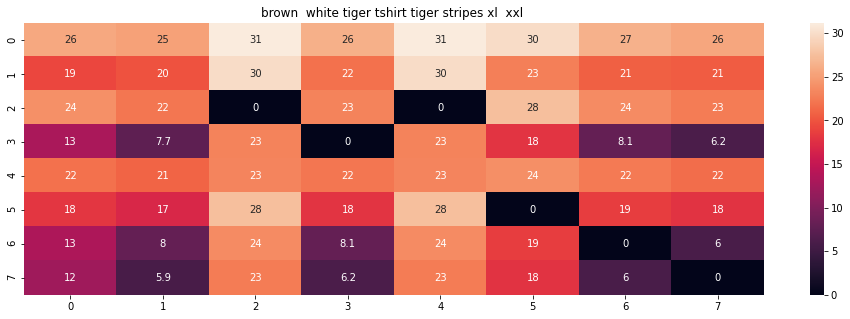

ASIN : B00JXQCWTO
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.6399066631610575


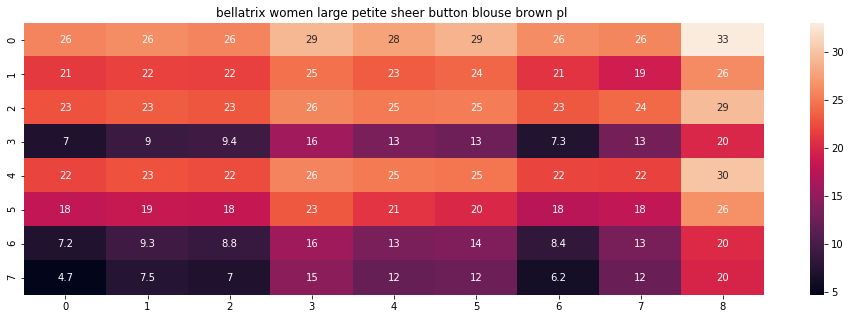

ASIN : B074QVMXSQ
Brand : bellatrix
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.640883673711728


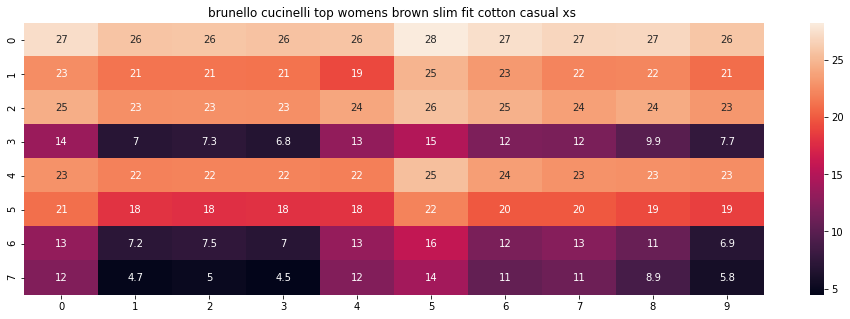

ASIN : B073ZCN5LG
Brand : Brunello Cucinelli
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.647621506911058


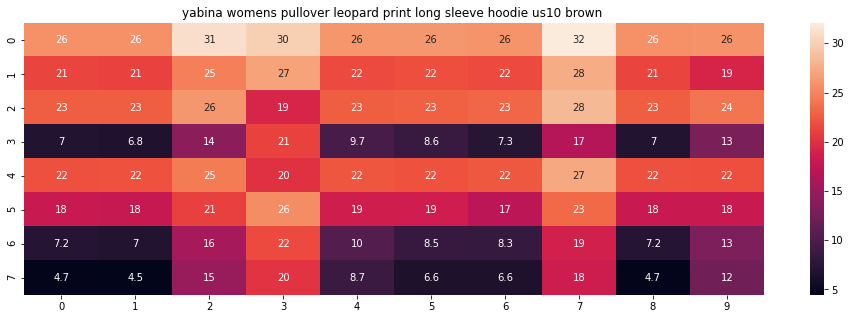

ASIN : B01KJUM6JI
Brand : YABINA
Color : Brown
Product Type :  BOOKS_1973_AND_LATER
Euclidean distance from input : 4.655373595868429


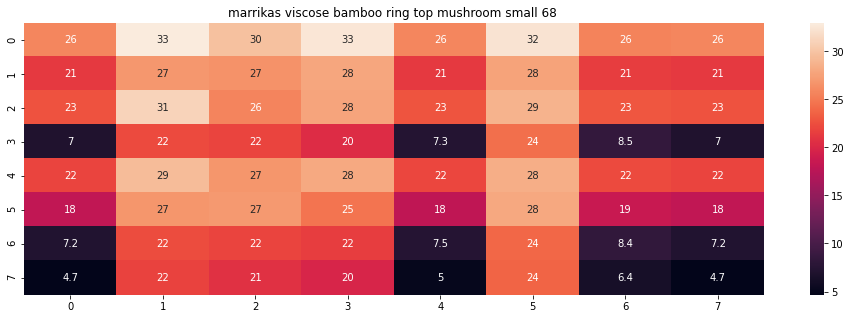

ASIN : B003SPYNAM
Brand : Marrikas
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.6661801637207425


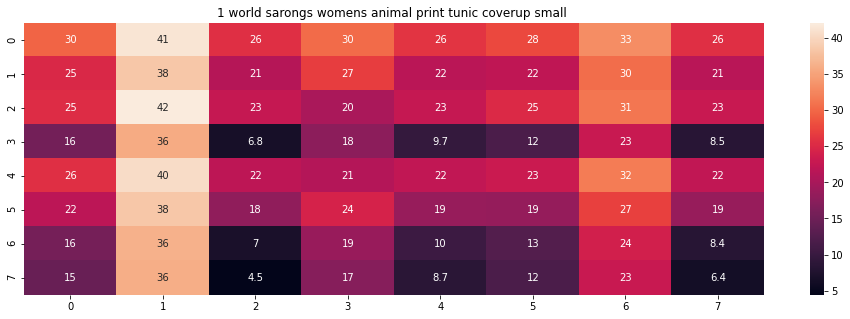

ASIN : B017YBAI9A
Brand : La Fleva
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.678308751032903


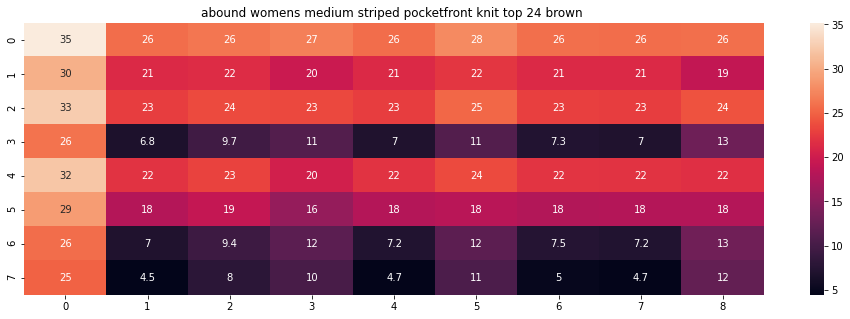

ASIN : B072M4ZF89
Brand : Abound
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.691239262184535


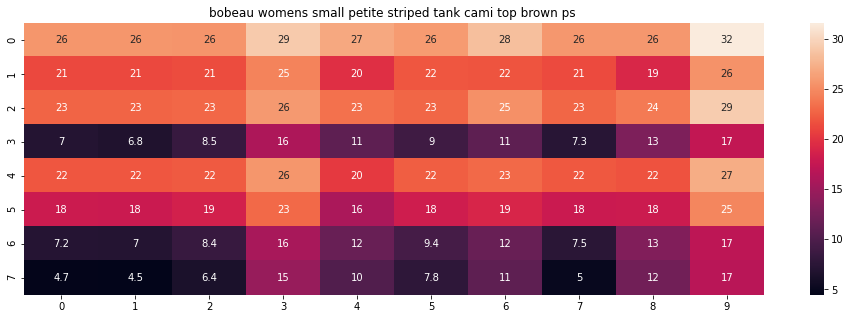

ASIN : B074P8YWV4
Brand : Bobeau
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.7067877921762715


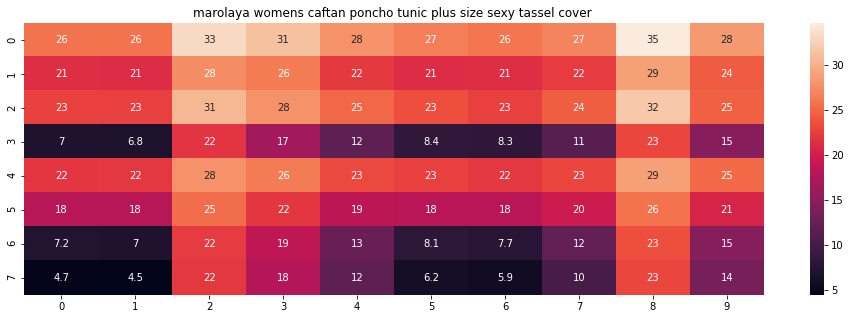

ASIN : B01CE40W16
Brand : Marolaya
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.725287430660346


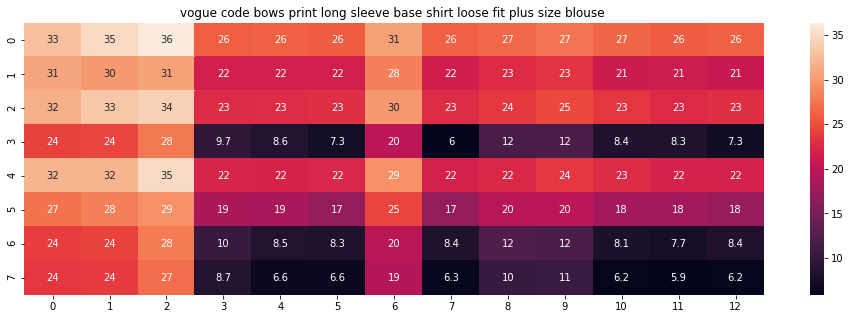

ASIN : B016MGC5VW
Brand : VOGUE CODE
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.741270564152644


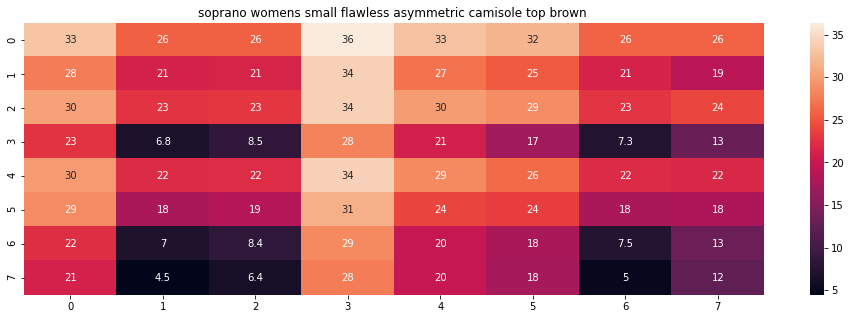

ASIN : B0758356K3
Brand : Soprano
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.744777364554577


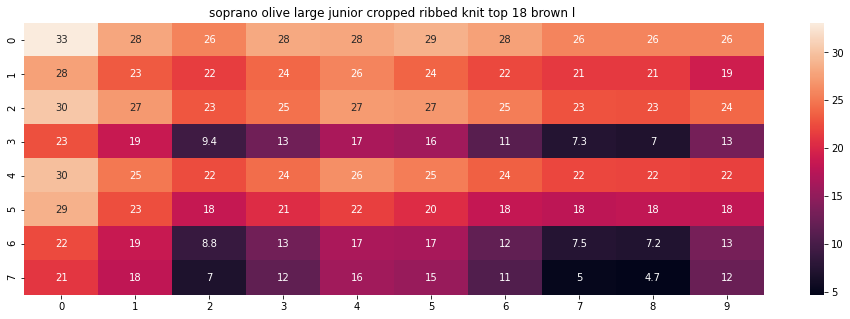

ASIN : B07288KFHF
Brand : Soprano
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.749544386320652


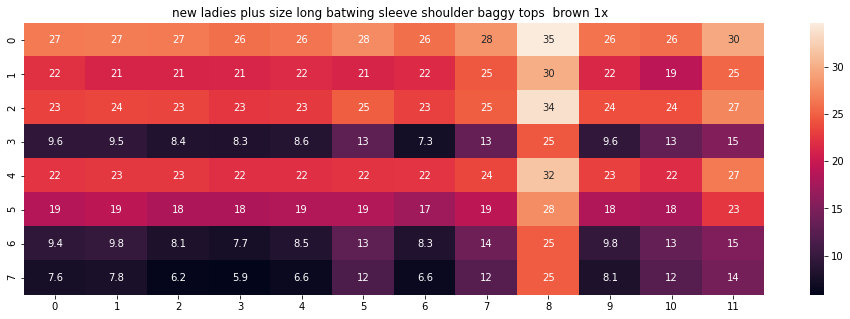

ASIN : B00MJPVIDW
Brand : Xclusive Collection
Color : Brown
Product Type :  DRESS
Euclidean distance from input : 4.749728863055889


In [111]:
idf_w2v_brand_col_visual(12566, 5, 5, 50, 5, 20)

## <b>Summary:
    
    1.Here we are giving more weight to titles, it works according to color <br>
    2.As we go down the similarity decreases, results are getting bad

## perference to image

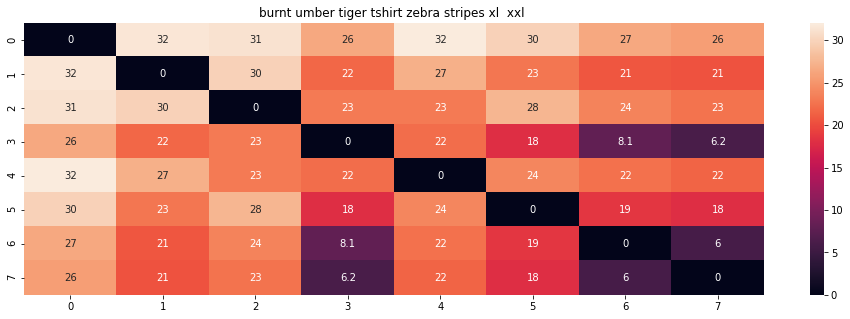

ASIN : B00JXQB5FQ
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 1.2968261076961286e-08


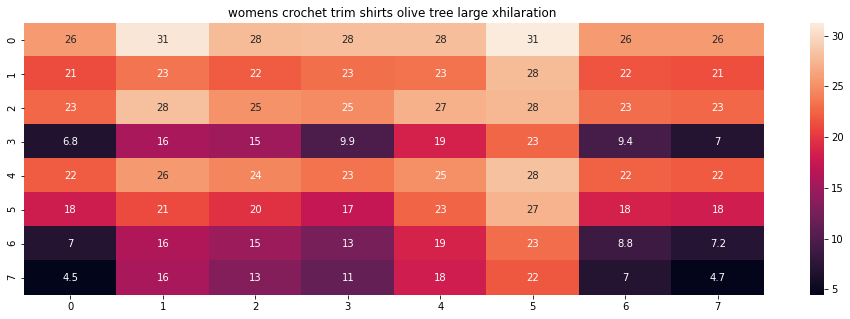

ASIN : B06XBHNM7J
Brand : Xhilaration
Color : Olive Tree
Product Type :  SHIRT
Euclidean distance from input : 29.48256579290498


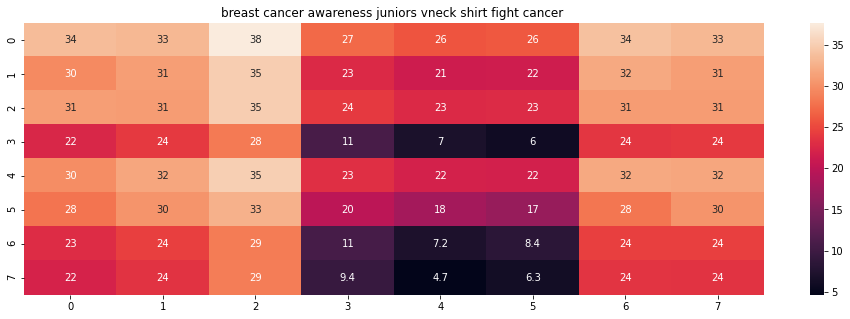

ASIN : B016CU40IY
Brand : Juiceclouds
Color : Black
Product Type :  SHIRT
Euclidean distance from input : 30.64979304592252


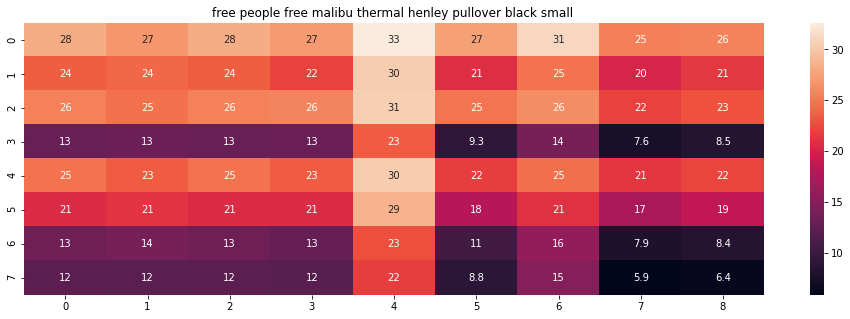

ASIN : B074MXY984
Brand : We The Free
Color : Black
Product Type :  SHIRT
Euclidean distance from input : 31.209446306665402


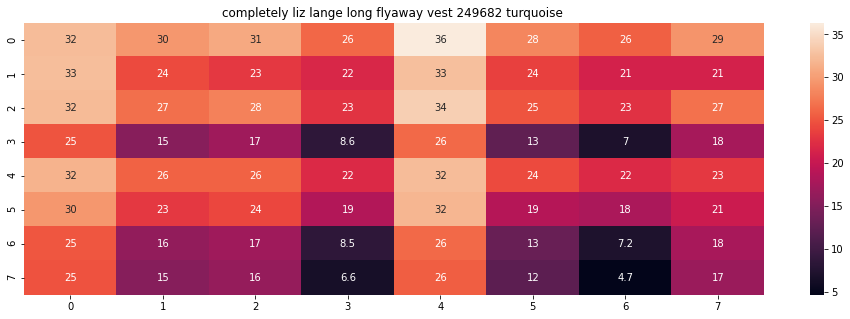

ASIN : B074LTBWSW
Brand : Liz Lange
Color : Turquoise
Product Type :  SHIRT
Euclidean distance from input : 31.210358663733476


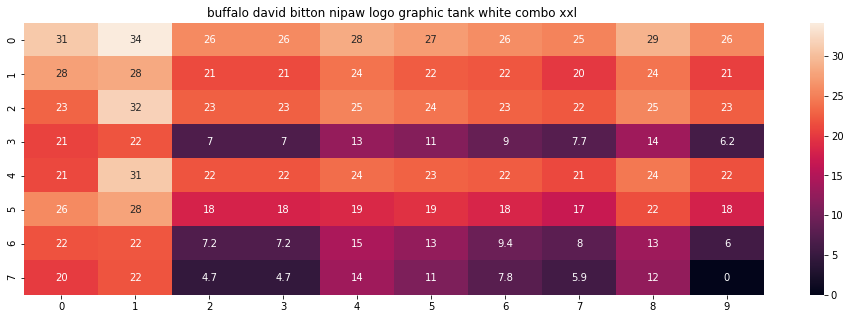

ASIN : B018H5AZXQ
Brand : Buffalo
Color : White Combo
Product Type :  SHIRT
Euclidean distance from input : 31.269700286219283


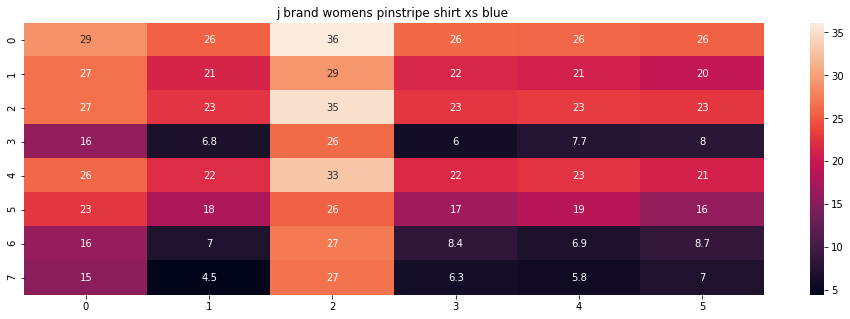

ASIN : B06XYP1X1F
Brand : J Brand Jeans
Color : Navy/Blk Stp
Product Type :  SHIRT
Euclidean distance from input : 31.3861335167518


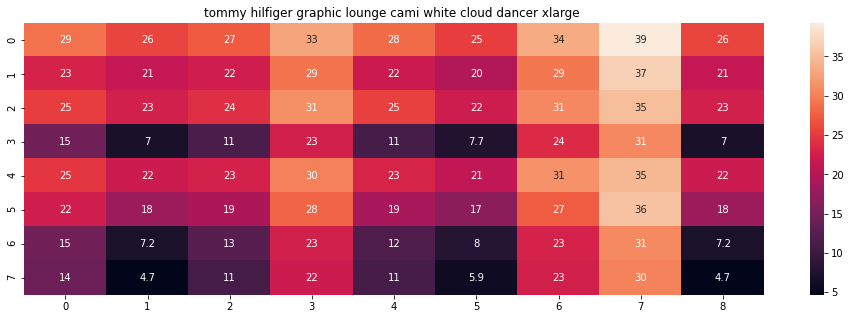

ASIN : B01BMSFYW2
Brand : igertommy hilf
Color : white cloud dancer
Product Type :  SHIRT
Euclidean distance from input : 31.560316995474007


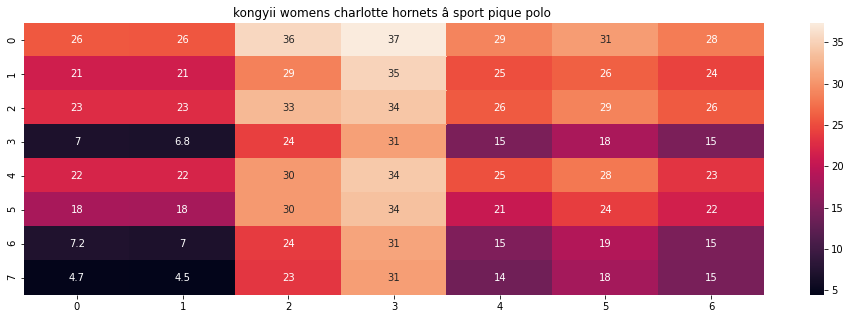

ASIN : B01FJVZST2
Brand : KONGYII
Color : White
Product Type :  SHIRT
Euclidean distance from input : 32.28489418821894


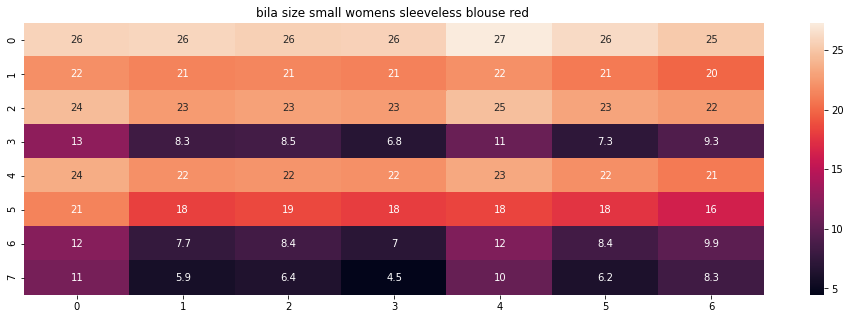

ASIN : B01L7ROZNC
Brand : Bila
Color : Red
Product Type :  SHIRT
Euclidean distance from input : 32.39329878792222


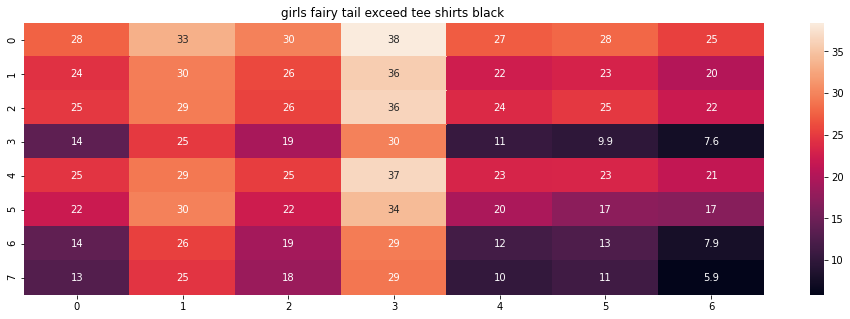

ASIN : B01L9F153U
Brand : ATYPEMX
Color : Black
Product Type :  SHIRT
Euclidean distance from input : 32.91237438700575


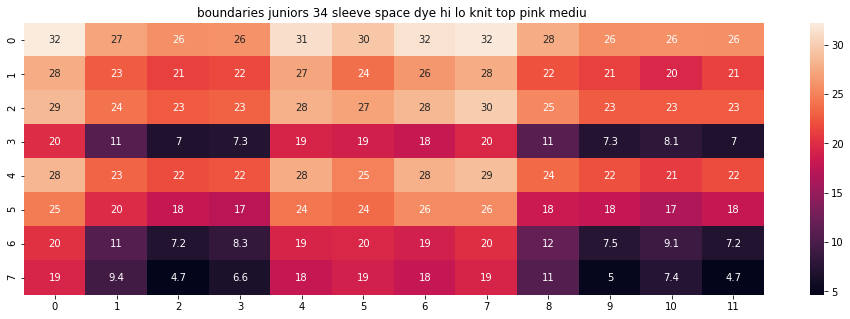

ASIN : B01EXXFS4M
Brand : No Boundaries
Color : Pink
Product Type :  SHIRT
Euclidean distance from input : 32.96083855264949


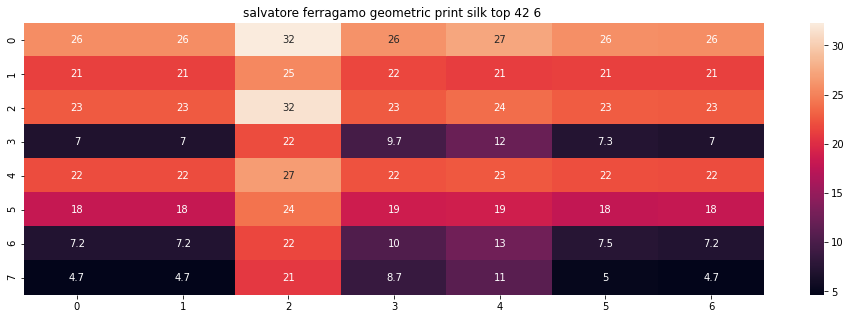

ASIN : B0756JTS1F
Brand : Salvatore Ferragamo
Color : Multi-color
Product Type :  SWEATER
Euclidean distance from input : 33.124154817698354


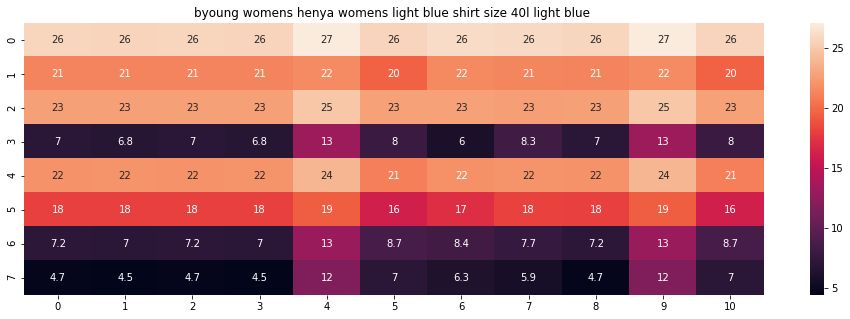

ASIN : B06Y41MRCH
Brand : Byoung
Color : Chambray Blue
Product Type :  SHIRT
Euclidean distance from input : 33.15646733615543


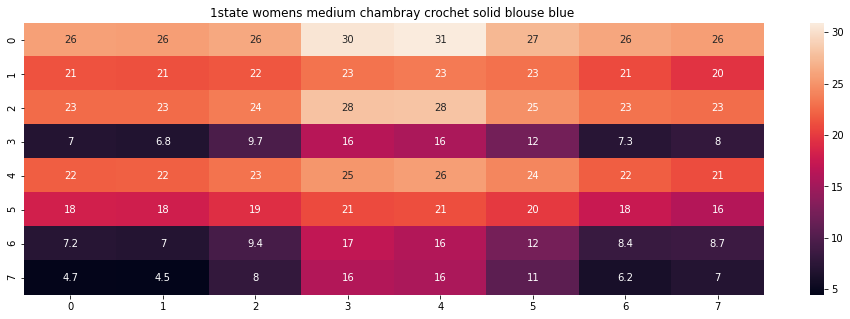

ASIN : B074MK6LV2
Brand : 1.State
Color : Blue
Product Type :  SHIRT
Euclidean distance from input : 33.21031327672931


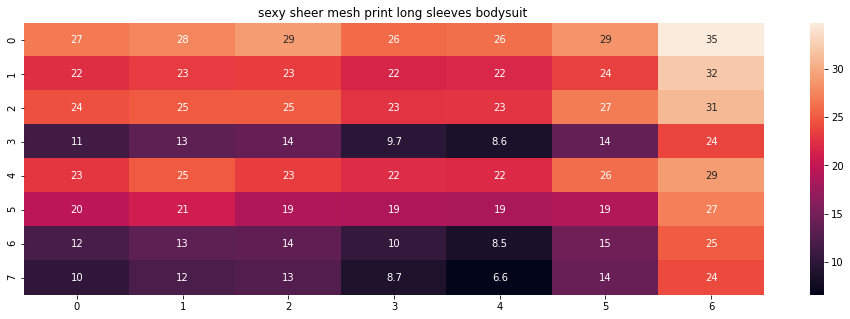

ASIN : B074Z5C98D
Brand : Ariella's closet
Color : Multi Color Black & Pink
Product Type :  APPAREL
Euclidean distance from input : 33.34747161979491


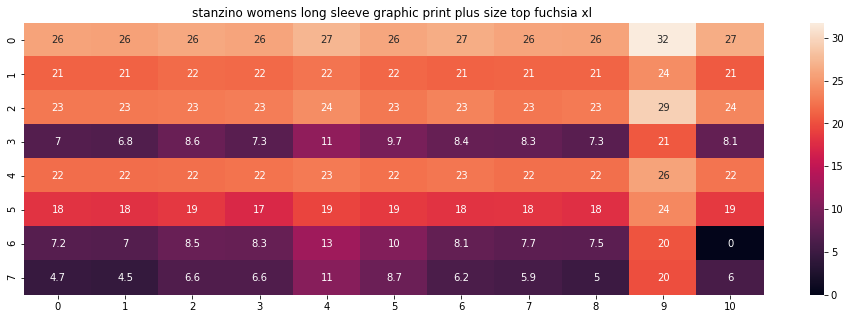

ASIN : B00DP4VHWI
Brand : Stanzino
Color : Fuchsia
Product Type :  SHIRT
Euclidean distance from input : 33.43426341335416


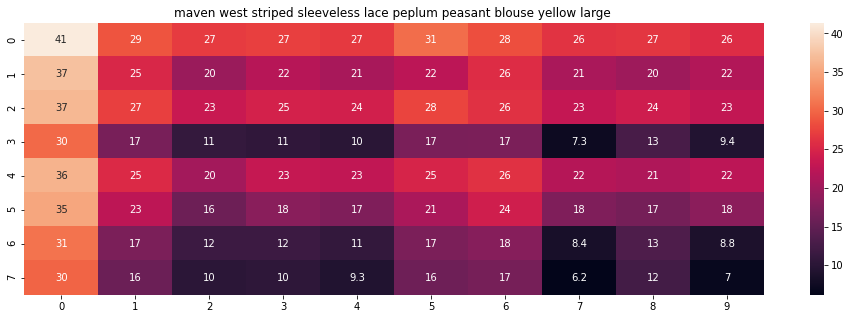

ASIN : B01M8GB3AL
Brand : Maven West
Color : Yellow
Product Type :  SHIRT
Euclidean distance from input : 33.471489715603965


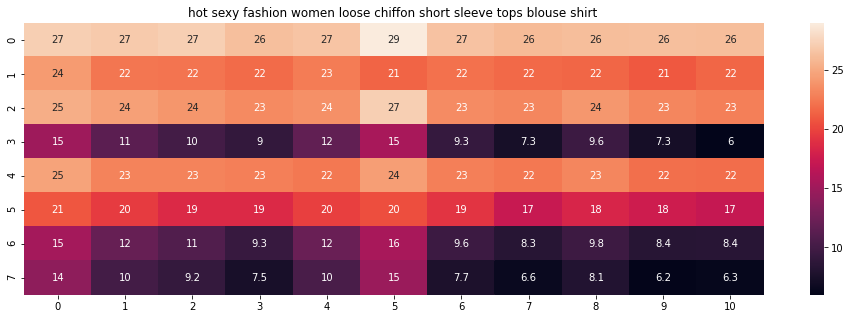

ASIN : B00JMAASRO
Brand : Wotefusi
Color : Multicolor
Product Type :  DRESS
Euclidean distance from input : 33.48222255031705


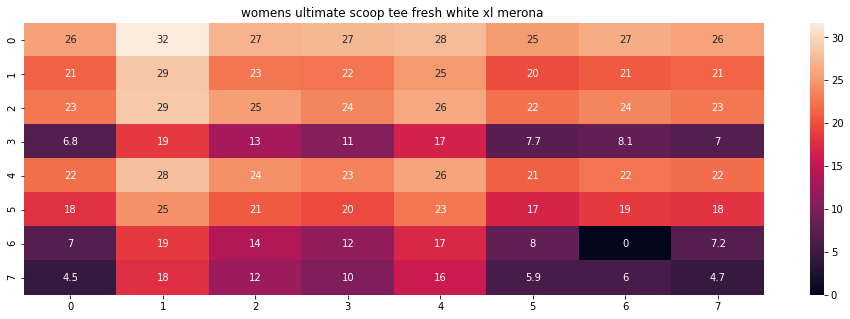

ASIN : B01G7XE50E
Brand : Merona
Color : White
Product Type :  SHIRT
Euclidean distance from input : 33.50775625580833


In [119]:
idf_w2v_brand_col_visual(12566, 5, 5, 5, 50, 20)

## <b>Summary:
    
    1.Here we are giving more weight to titles, it works according to image <br>
    2.As we go down the similarity decreases, results are getting bad

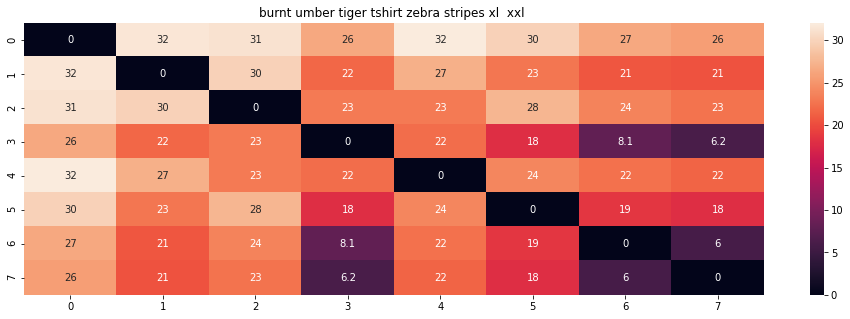

ASIN : B00JXQB5FQ
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 5.4383030322740875e-08


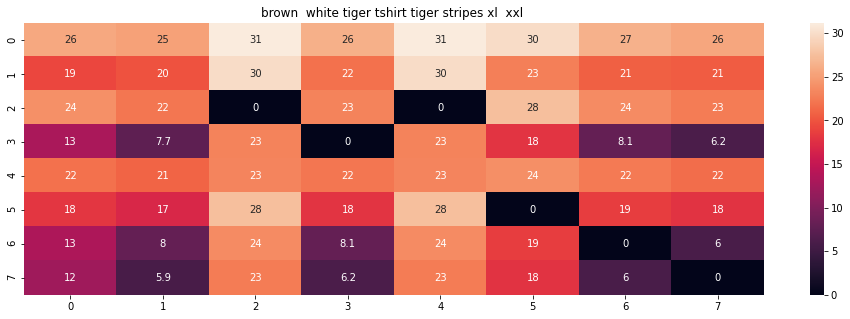

ASIN : B00JXQCWTO
Brand : Si Row
Color : Brown
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 3.3308792606476816


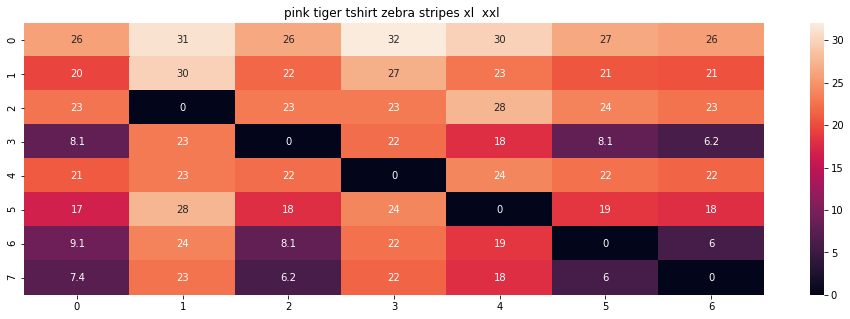

ASIN : B00JXQASS6
Brand : Si Row
Color : Pink
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 3.3319617487934883


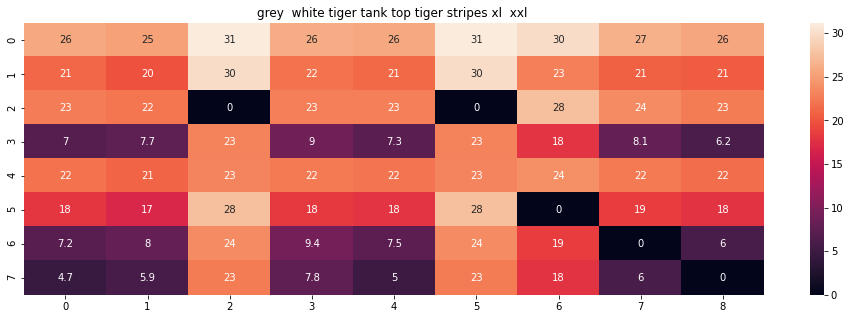

ASIN : B00JXQAFZ2
Brand : Si Row
Color : Grey
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 3.9248500702085587


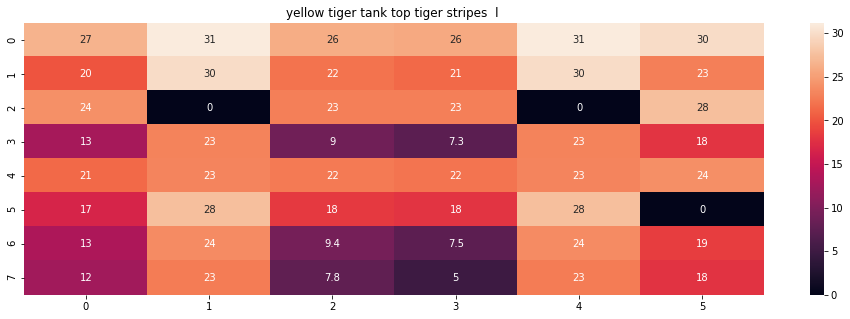

ASIN : B00JXQAUWA
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.016653442499385


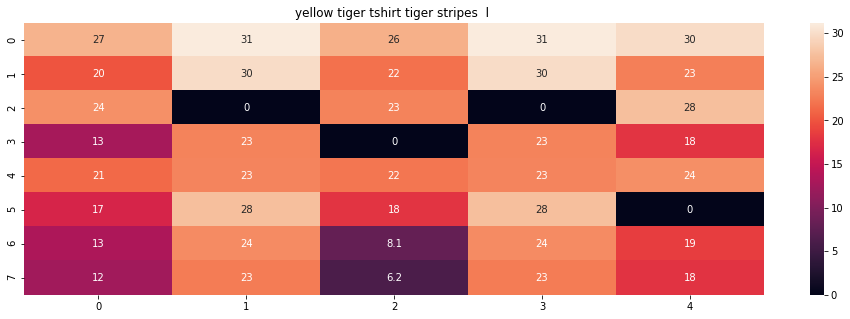

ASIN : B00JXQCUIC
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.040439433552813


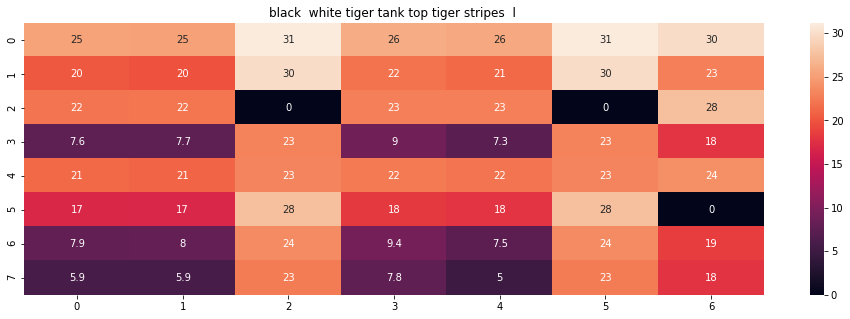

ASIN : B00JXQAO94
Brand : Si Row
Color : White
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.074247003487288


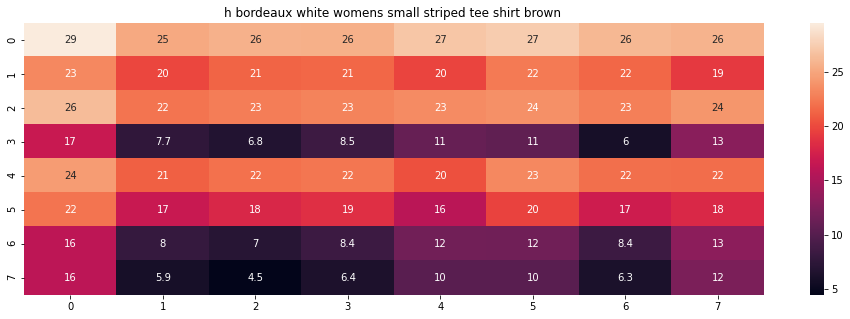

ASIN : B072BVB47Z
Brand : H By Bordeaux
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.420128410093246


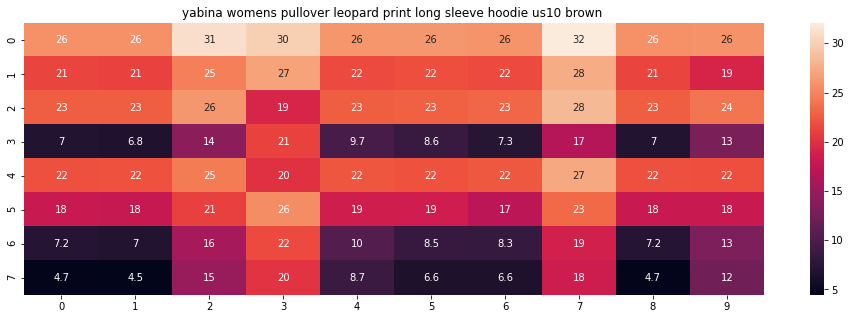

ASIN : B01KJUM6JI
Brand : YABINA
Color : Brown
Product Type :  BOOKS_1973_AND_LATER
Euclidean distance from input : 4.540650603878065


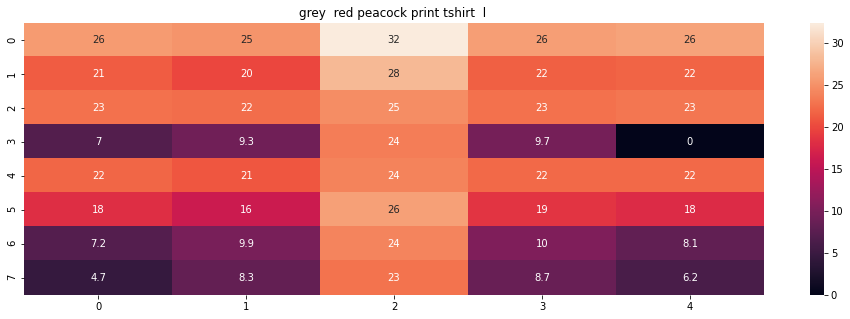

ASIN : B00JXQCFRS
Brand : Si Row
Color : Grey
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.558033112673277


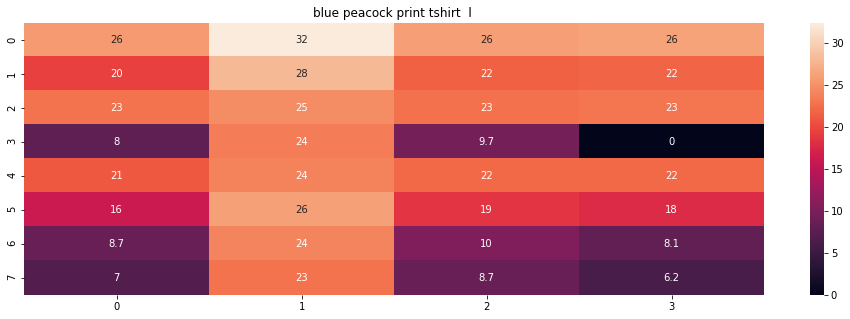

ASIN : B00JXQC8L6
Brand : Si Row
Color : Blue
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.566377406083055


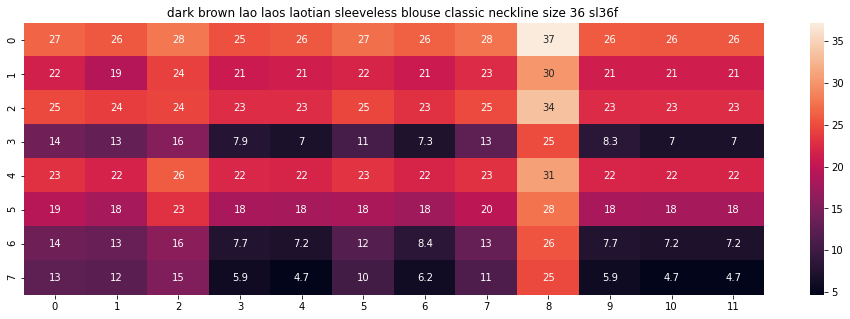

ASIN : B074J7BCYM
Brand : Nanon
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.624722889191825


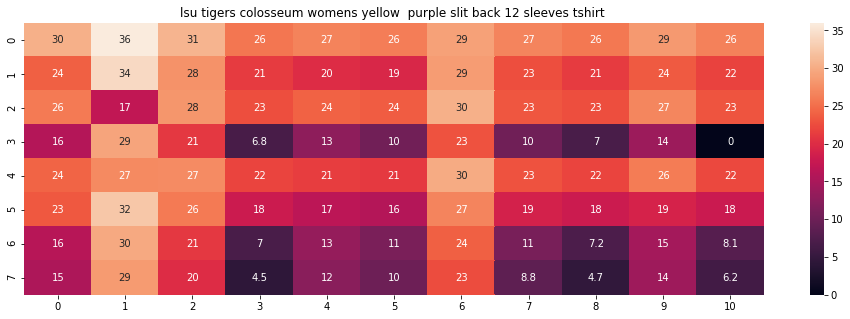

ASIN : B073R5Q8HD
Brand : Colosseum
Color : Yellow
Product Type :  SPORTING_GOODS
Euclidean distance from input : 4.6307260907007874


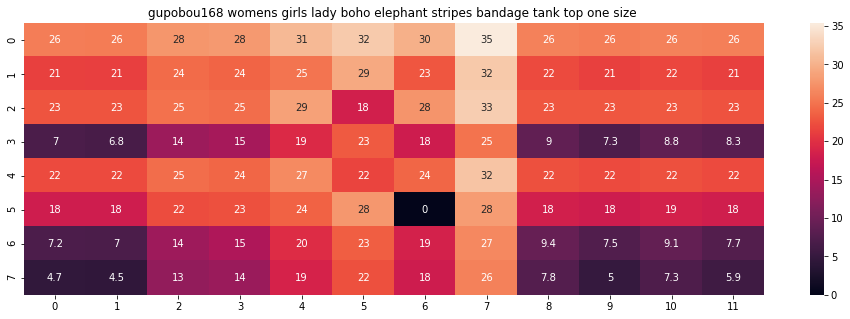

ASIN : B01ER184O6
Brand : GuPoBoU168
Color : Brown
Product Type :  SKIRT
Euclidean distance from input : 4.634100744062037


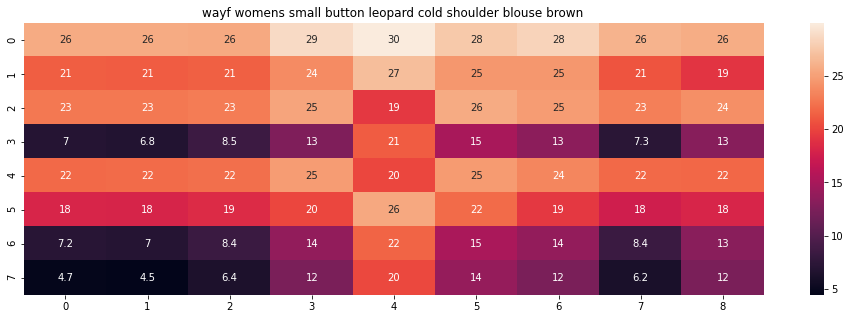

ASIN : B01M06V4X1
Brand : WAYF
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.640108375425444


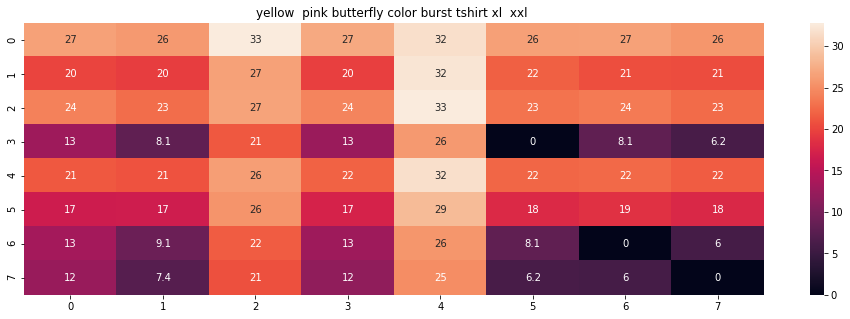

ASIN : B00JXQBBMI
Brand : Si Row
Color : Yellow
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.647966840306845


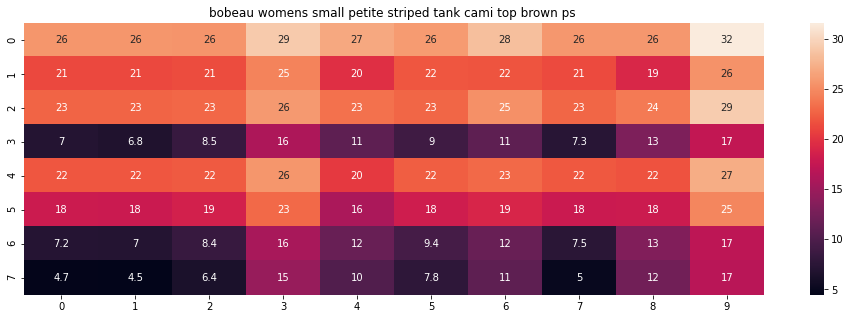

ASIN : B074P8YWV4
Brand : Bobeau
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.672427475097823


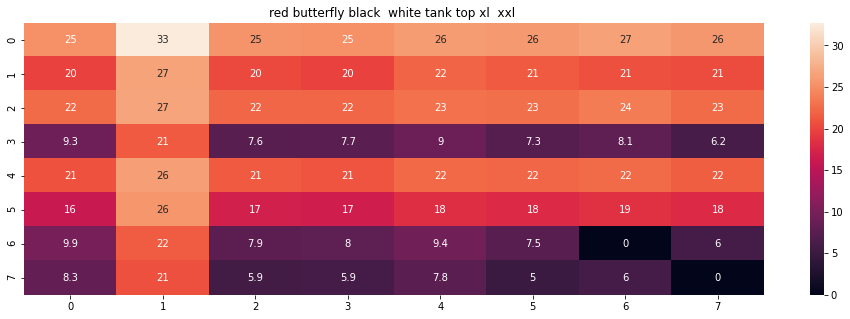

ASIN : B00JV63CW2
Brand : Si Row
Color : Red
Product Type :  TOYS_AND_GAMES
Euclidean distance from input : 4.673899496871865


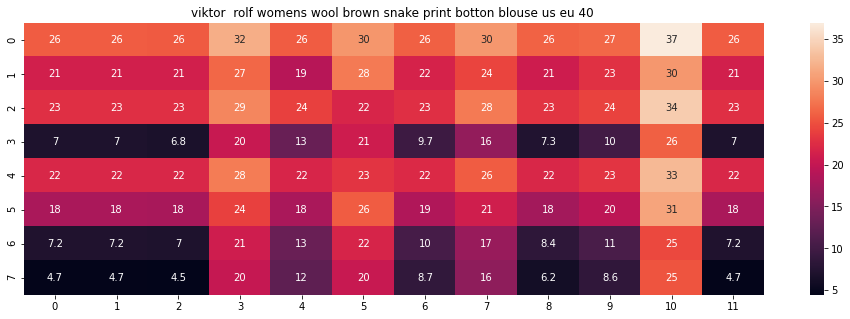

ASIN : B00LEHNVZ4
Brand : Viktor & Rolf
Color : Brown
Product Type :  BLAZER
Euclidean distance from input : 4.693990005985383


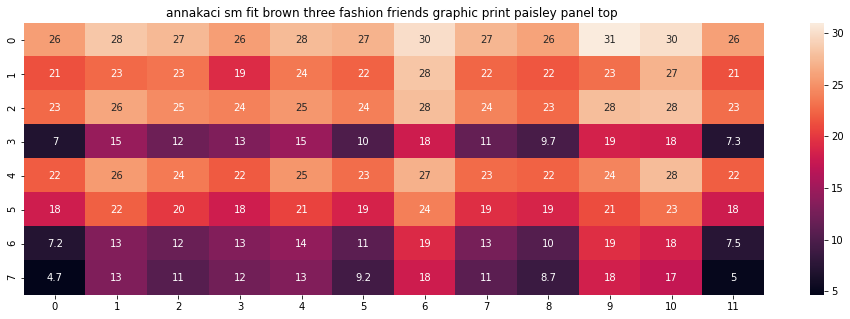

ASIN : B00BTJKAQ0
Brand : Anna-Kaci
Color : Brown
Product Type :  SHIRT
Euclidean distance from input : 4.7075190390309976


In [122]:
idf_w2v_brand_col_visual(12566, 50, 50, 50, 5, 20)

## <b>Conculsions:
    
    1.Here we are giving more weight to titles,brand,color, I think these combination works well         after playing around weights 
    2.As we go down the similarity decreases, results are getting bad